# TPC-C Multi-Tenant with Distributed PVC and Tuned PostgreSQL 17.5 - V26

* data is generated and loaded into databases in a distributed filesystem
* experiments do not use preloaded data

* PostgreSQL uses improved args:

In [1]:
import pandas as pd
pd.set_option("display.max_rows", None)
pd.set_option('display.max_colwidth', None)
import matplotlib.pyplot as plt
import seaborn as sns
import re
import numpy as np

from bexhoma import collectors

%matplotlib inline

# Functions for Nice Plots

In [2]:
def sanitize_filename(title, max_length=100):
    # Replace non-alphanumeric characters with underscores
    safe = re.sub(r'[^a-zA-Z0-9-_]+', '_', title.strip())
    # Truncate to a safe length
    return safe[:max_length].rstrip('_')
    
def plot_bars(df, y, title, estimator):
    df_plot = df.copy()
    #df_plot = df_plot[df_plot['client']=='1']
    df_plot = df_plot.sort_values(['num_tenants','type'])
    # Hatch styles for each type
    hatch_map = {
        'container': '/',
        'database': '\\',
        'schema': 'x'
    }
    hue_order = ['container', 'database', 'schema']
    # Create the plot
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(
        data=df_plot,
        x='num_tenants',
        y=y,
        hue='type',
        estimator=estimator,
        palette='Set2',
        hue_order=hue_order
    )
    show_height = False
    if show_height:
        for bar in ax.patches:
            height = bar.get_height()
            if height > 0:
                ax.text(
                    bar.get_x() + bar.get_width() / 2,  # X: center of bar
                    height,                             # Y: top of bar
                    f'{height:.1f}',                    # Text (1 decimal place)
                    ha='center', va='bottom', fontsize=8
                )
    # Get tick positions (i.e., the x-axis categories)
    xticks = ax.get_xticks()
    bar_width = ax.patches[0].get_width()
    # Create a mapping from (num_tenants, type) to hatch
    grouped = df_plot.groupby(['num_tenants', 'type']).agg({y: estimator}).reset_index()
    #print(grouped)
    grouped_dict = {(row['num_tenants'], row['type']): hatch_map[row['type']] for _, row in grouped.iterrows()}
    bars = sorted(ax.patches, key=lambda bar: bar.get_x() if bar.get_height() > 0 else 10000)
    for bar, (_, row) in zip(bars, grouped.iterrows()):
        bar.my_id = (row['num_tenants'], row['type'])  # or anything else like an index or uuid
        bar.set_hatch(hatch_map[row['type']]) #grouped_dict[(bar.my_id)])
        bar.set_edgecolor('black')
        bar.set_linewidth(1)
    handles, labels = ax.get_legend_handles_labels()
    for handle, label in zip(handles, labels):
        hatch = hatch_map.get(label, '')
        handle.set_hatch(hatch)
    # Final touches
    plt.legend(title='Type')
    ax.legend(fontsize=18)
    #ax.legend(fontsize=18, loc='upper left', bbox_to_anchor=(1, 1))  # move outside
    plt.title(f"{title}", fontsize=24)
    #plt.title(f"{title} by Number of Tenants and Type", fontsize=24)
    plt.xlabel("Number of Tenants", fontsize=18)
    ax.tick_params(axis='both', labelsize=16)
    # Remove y-axis label
    ax.set_ylabel('')  # or ax.set(ylabel='')
    plt.tight_layout()
    if b_plot_save:
        filename = filename_prefix + sanitize_filename(title) + ".png"    
        plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()

def plot_boxplots(df, y, title):
    plt.figure(figsize=(10, 6))
    # Hatch styles for each type
    hatch_map = {
        'container': '/',
        'database': '\\',
        'schema': 'x'
    }
    hue_order = ['container', 'database', 'schema']
    
    # Plot boxplots grouped by num_tenants and colored by type
    ax = sns.boxplot(
        data=df,
        x='num_tenants',
        y=y,#'Goodput (requests/second)',
        hue='type',
        palette='Set2'  # consistent colors per type
    )
    # Add vertical separator lines between groups
    # Get the number of unique num_tenants and type
    num_groups = df['num_tenants'].nunique()
    num_types = df['type'].nunique()
    
    # Extract hue order
    hue_order = ax.get_legend_handles_labels()[1]
    num_hue = len(hue_order)
    
    # Get hue order from seaborn (types)
    _, type_order = ax.get_legend_handles_labels()
    num_types = len(type_order)
    
    #print(len(ax.patches))
    # Set hatches correctly: patches are grouped by x then by hue
    for i, patch in enumerate(ax.patches):
        #print(i)
        type_index = i // (num_groups)
        if type_index >= num_types:
            break
        type_name = type_order[type_index]
        patch.set_hatch(hatch_map.get(type_name, ''))
        #print(hatch_map.get(type_name, ''))
        patch.set_edgecolor('black')
        patch.set_linewidth(1)
    
    # Each num_tenants group has num_types boxes
    for i in range(1, num_groups):
        xpos = i - 0.5 #0.5
        ax.axvline(x=xpos, color='gray', linestyle='--', alpha=0.5)
    
    
    # Update legend with matching hatches
    handles, labels = ax.get_legend_handles_labels()
    for handle, label in zip(handles, labels):
        hatch = hatch_map.get(label, '')
        handle.set_hatch(hatch)
        handle.set_edgecolor('black')
        handle.set_linewidth(1)
    
    #title = "Goodput [req/s] Distribution per Tenant"
    plt.title(title, fontsize=24)
    plt.xlabel("Number of Tenants")
    plt.ylabel("")#"Goodput (requests/second)")
    plt.xlabel("Number of Tenants", fontsize=18)
    ax.tick_params(axis='both', labelsize=16)
    plt.legend(title="Type")
    ax.legend(fontsize=18)
    plt.tight_layout()
    if b_plot_save:
        filename = filename_prefix + sanitize_filename(title) + ".png"    
        plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()

def plot_lines(df, y, title):
    plt.figure(figsize=(10, 6))

    # Consistent colors per type
    palette = {
        'container': '#66c2a5',
        'database': '#fc8d62',
        'schema': '#8da0cb'
    }
    hue_order = ['container', 'database', 'schema']
    
    # Plot lineplot grouped by num_tenants and colored by type

    ax = sns.lineplot(
        data=df.reset_index(),
        x="timestamp",
        y=y,
        hue="type",
        hue_order=hue_order,
        style="num_tenants",          # different line styles per type
        markers=False,          # markers at points
        dashes=True,
        estimator=None,   # plot raw data without aggregation
        errorbar=None,
        #fill=False,         # <- this disables area fill!
        #ci=None,
        palette=palette
    )

    # Axis labels and title
    plt.title(title, fontsize=24)
    plt.xlabel("Second", fontsize=18)
    #plt.ylabel(y, fontsize=18)
    ax.set(ylabel=None)
    ax.tick_params(axis='both', labelsize=16)

    # Legend formatting
    plt.legend(fontsize=16, title_fontsize=18)
    
    # Save
    if b_plot_save:
        filename = filename_prefix + "_" + title.replace(" ", "_") + ".png"
        plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()

#print("Seaborn version:", sns.__version__)

# Collect Results

In [3]:
#path = r"C:\data\benchmarks"
path = r"/home/perdelt/benchmarks"
filename_prefix = "tpcc_sharedlocal_"
b_plot_save = True

In [4]:
codes = [
    
    "1758279829", # container 1
    "1758277451", # database 1
    "1758275241", # schema 1

    "1758287255", # container 2
    "1758284694", # database 2
    "1758282052", # schema 2

    "1758296938", # container 3
    "1758294782", # database 3
    "1758292405", # schema 3

    "1758304941", # container 4
    "1758302525", # database 4
    "1758300028", # schema 4

    "1758313830", # container 5
    "1758311156", # database 5
    "1758308182", # schema 5

    "1758323421", # container 6
    "1758320705", # database 6
    "1758317960", # schema 6

    "1758332661", # container 7
    "1758329997", # database 7
    "1758327464", # schema 7

    "1758343541", # container 8
    "1758340521", # database 8
    "1758337754", # schema 8

    "1758355125", # container 9
    "1758352206", # database 9
    "1758349289", # schema 9

    "1758368524", # container 10
    "1758364637", # database 10
    "1758360928", # schema 10

]

codes

['1758279829',
 '1758277451',
 '1758275241',
 '1758287255',
 '1758284694',
 '1758282052',
 '1758296938',
 '1758294782',
 '1758292405',
 '1758304941',
 '1758302525',
 '1758300028',
 '1758313830',
 '1758311156',
 '1758308182',
 '1758323421',
 '1758320705',
 '1758317960',
 '1758332661',
 '1758329997',
 '1758327464',
 '1758343541',
 '1758340521',
 '1758337754',
 '1758355125',
 '1758352206',
 '1758349289',
 '1758368524',
 '1758364637',
 '1758360928']

In [5]:
collect = collectors.benchbase(path, codes)

# Get all Metrics Metadata

In [6]:
code = codes[0]
evaluate = collect.get_evaluator(code)
collect.df_metrics = collect.get_metrics(evaluate)

collect.df_metrics

,title,active,type,metric
total_cpu_memory,Memory Usage [MiB],True,cluster,gauge
total_cpu_memory_cached,Memory Usage Cached [MiB],True,cluster,gauge
total_cpu_util,CPU Utilization,True,cluster,gauge
total_cpu_throttled,CPU Throttle,True,cluster,gauge
total_cpu_throttled_s,CPU Throttled Time [s],True,cluster,counter
total_cpu_util_others,CPU Utilization Others,False,cluster,gauge
total_cpu_util_s,CPU Utilization Time [s],True,cluster,counter
total_cpu_util_user_s,CPU User Time [s],True,cluster,counter
total_cpu_util_sys_s,CPU System Time [s],True,cluster,counter
total_cpu_util_others_s,CPU Utilization Time Others [s],False,cluster,counter


# Get Values Aggregated per SUT and per Experiment

In [7]:
df_performance = collect.get_monitoring_all(type="stream")
df_performance.T

,0,1,0,1,0,1,0,1,0,1,...,0,1,0,1,0,1,0,1,0,1
client,1,2,1,2,1,2,1,2,1,2,...,1,2,1,2,1,2,1,2,1,2
Memory Usage [MiB],8748.56,9353.81,8457.75,8740.95,8788.9,9615.85,16880.04,17122.38,10683.17,11299.59,...,29698.02,31314.69,27740.33,30815.97,81572.31,82470.27,32079.79,34731.8,30101.18,35060.26
Memory Usage Cached [MiB],10169.12,11328.6,9672.74,10225.59,10214.4,11751.46,19299.69,19892.0,13070.5,14206.79,...,40532.28,44177.46,38040.68,43063.32,92403.56,93898.79,44071.7,49519.05,41536.52,49223.07
CPU Utilization,4.31,1.81,1.49,1.48,4.4,4.45,3.18,1.48,3.12,4.2,...,17.62,12.84,12.27,13.55,2.26,4.82,25.34,15.22,15.3,18.87
CPU Throttle,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Throttled Time [s],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Utilization Time [s],2816.69,1137.55,971.19,952.14,2764.95,2736.07,1965.09,943.48,1971.96,2872.42,...,10847.63,7825.67,7556.86,8366.83,1435.88,3115.68,15721.54,10122.07,10185.66,12727.6
CPU User Time [s],1658.91,673.96,567.91,551.08,1640.1,1623.86,1146.03,548.65,1146.96,1641.89,...,6383.32,4472.69,4338.91,4805.45,867.88,1735.47,9536.34,6099.83,5999.88,7552.49
CPU System Time [s],1157.78,463.59,403.29,401.07,1124.85,1112.21,819.05,394.83,825.0,1230.53,...,4464.31,3352.98,3217.96,3561.38,568.01,1380.24,6185.2,4022.24,4185.78,5175.11
Network Rx Total [MiB],5142.92,2807.06,1775.65,1777.0,5253.7,4285.61,3340.43,1702.41,3229.25,4505.97,...,16174.33,9741.13,11206.08,12032.8,1676.89,4259.83,22155.39,13174.91,13441.21,16498.65


# Bar Plots of Aggregated Values per Metric

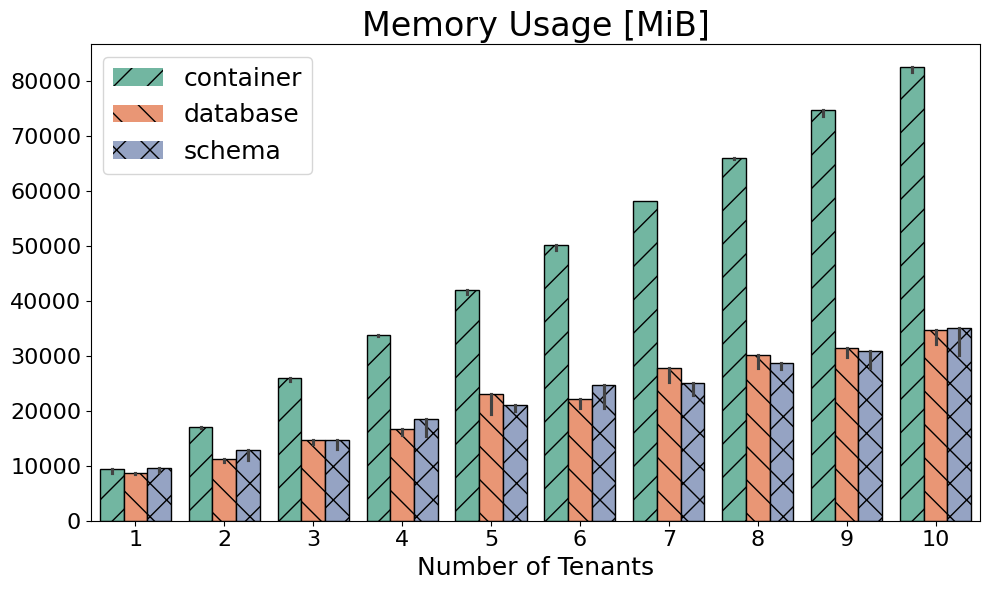

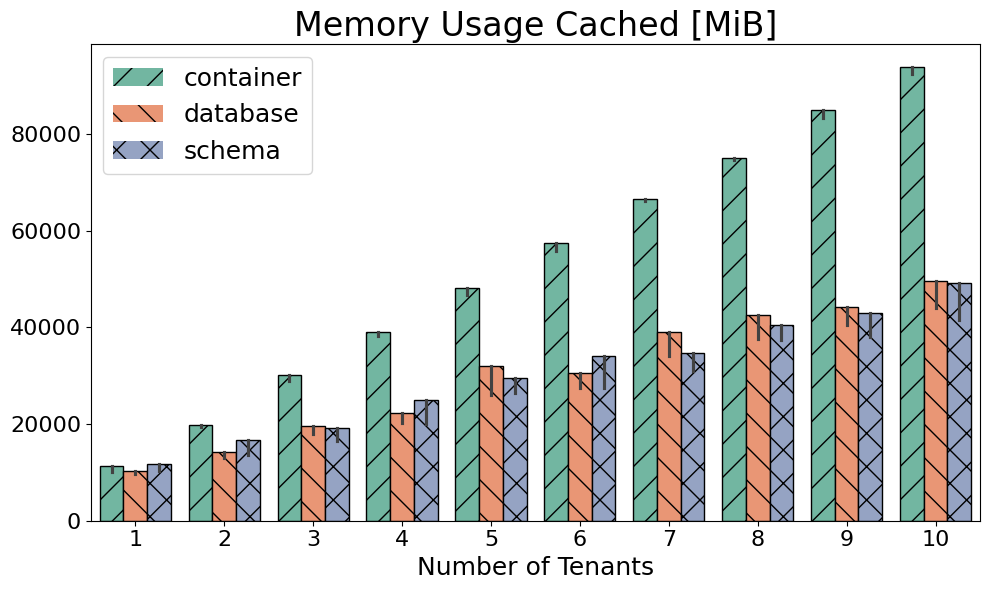

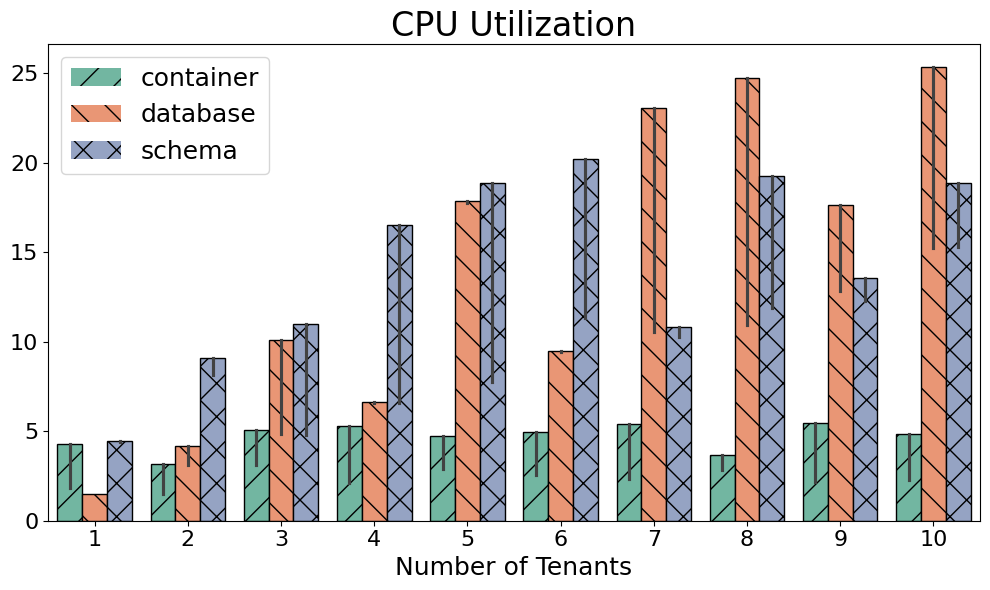

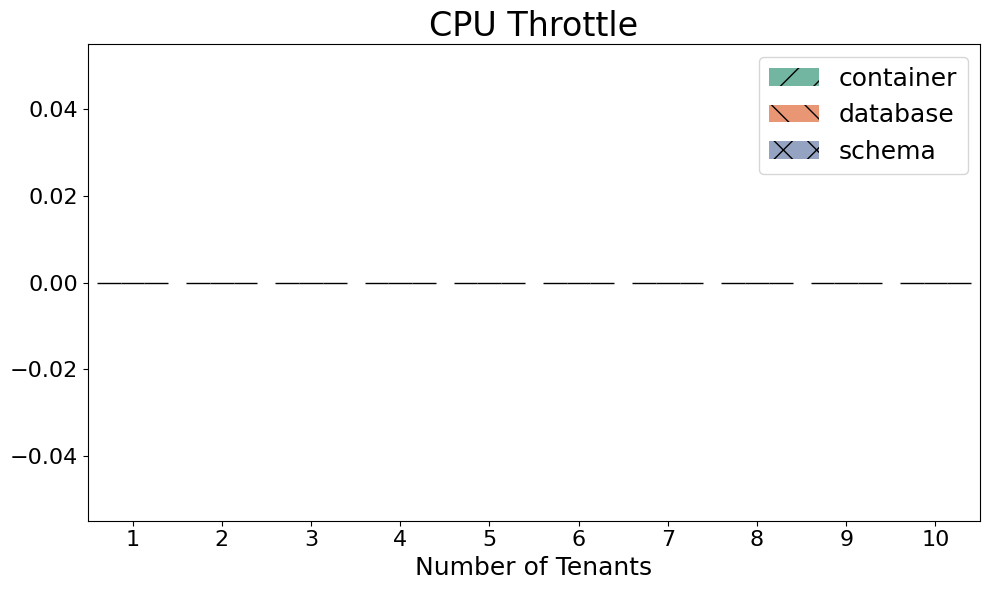

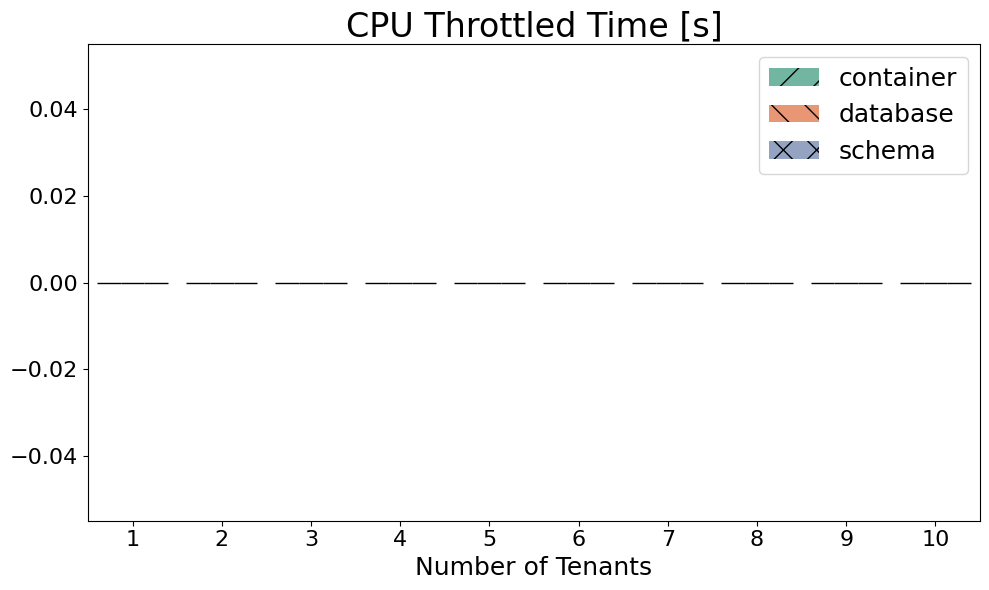

...

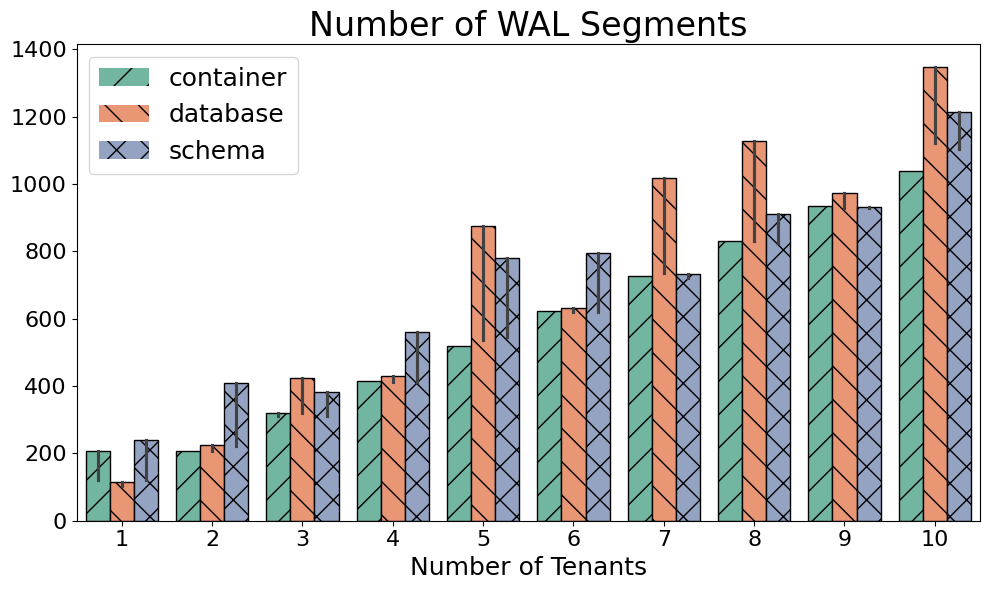

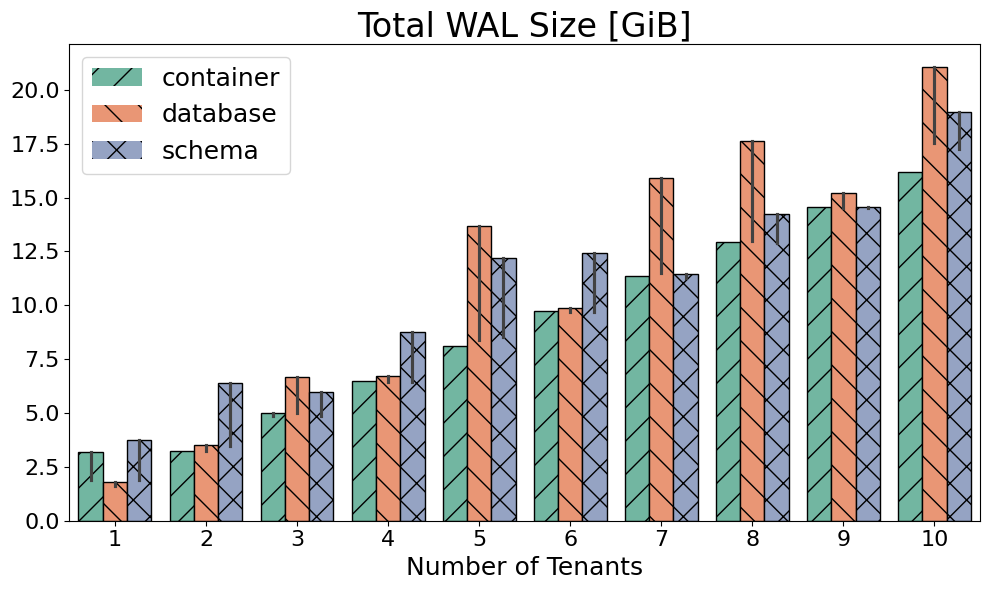

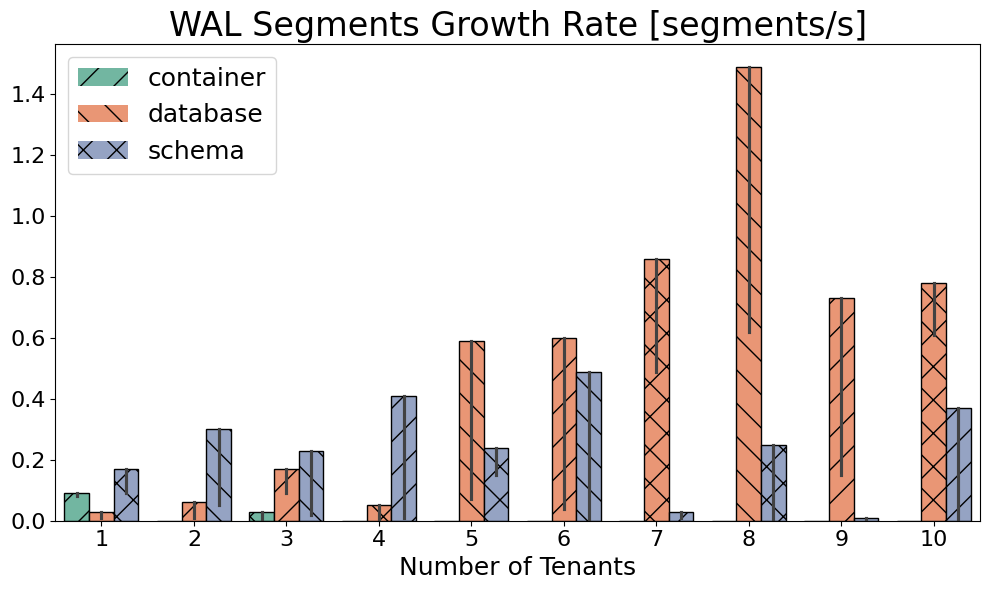

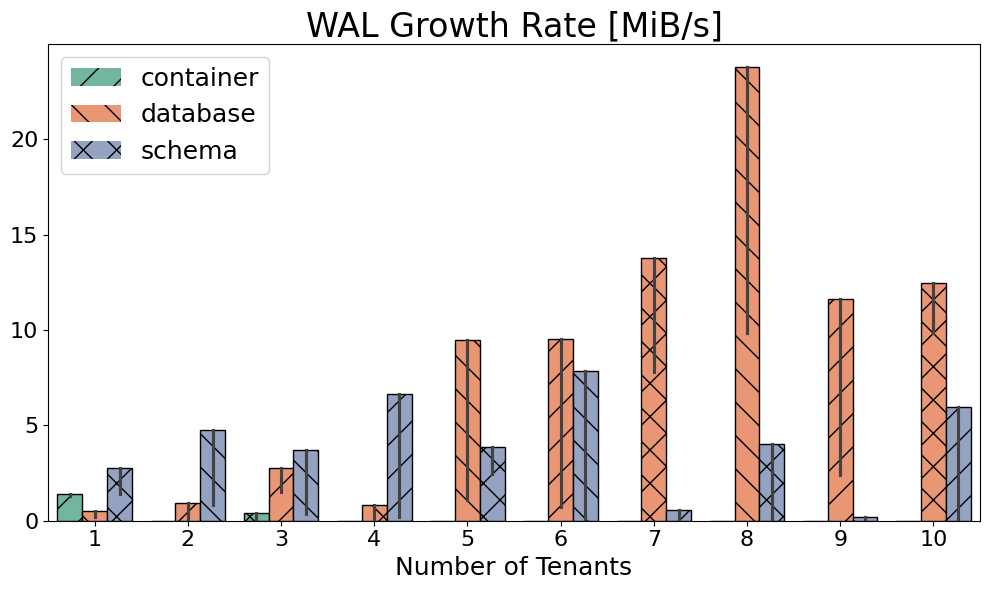

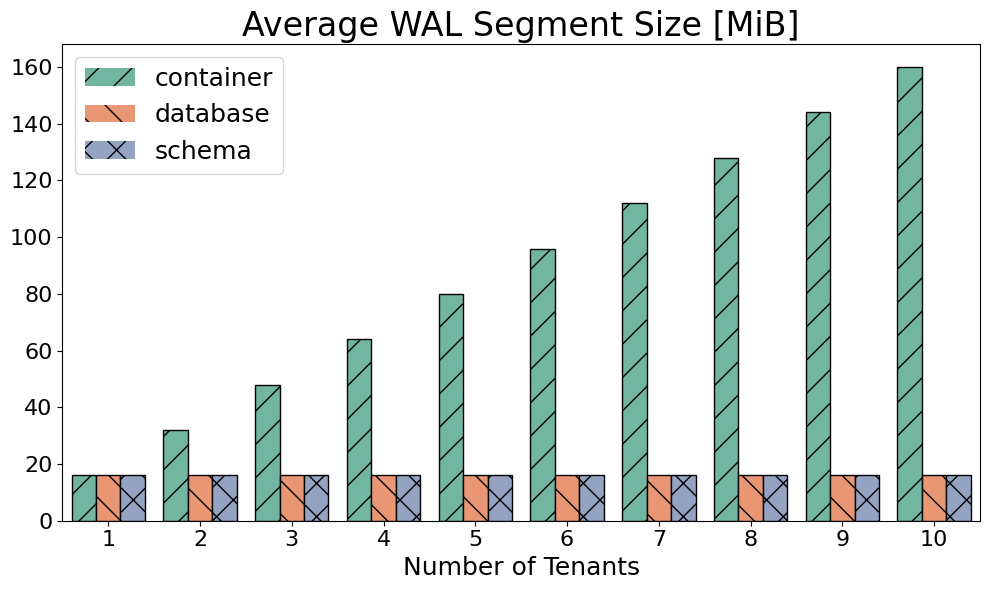

In [8]:
for idx, row in collect.df_metrics.iterrows():
    if row["active"] == False:
        continue
    col_name = row["title"]
    plot_bars(df_performance, y=col_name, title=col_name, estimator='max')

# Boxplot of All Metrics for a Single Experiment

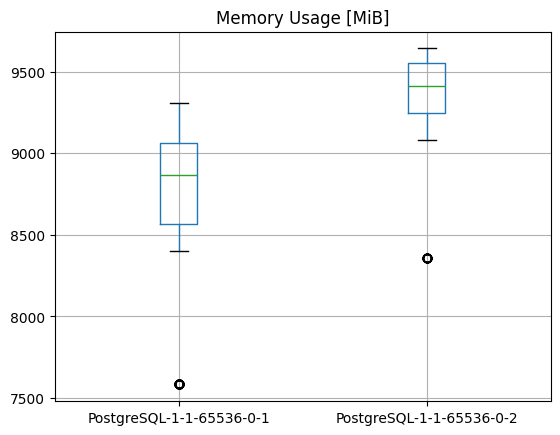

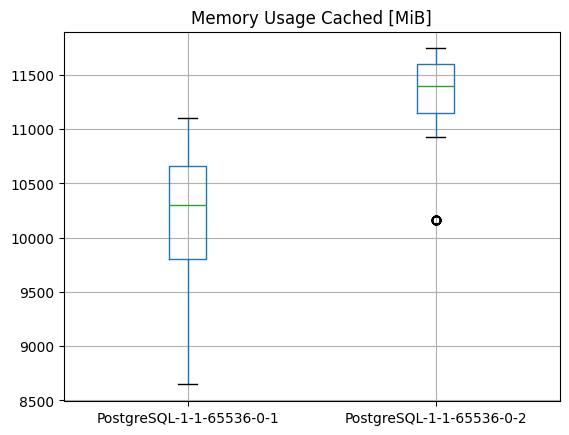

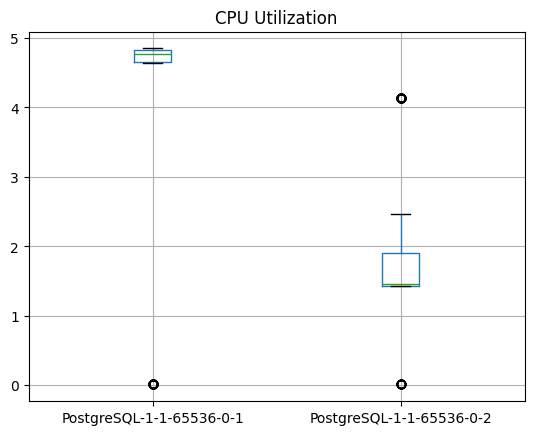

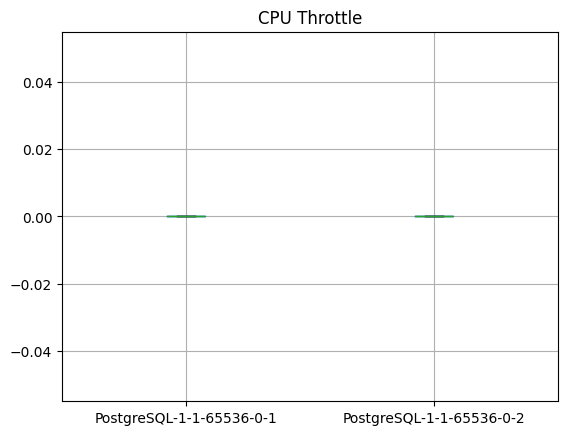

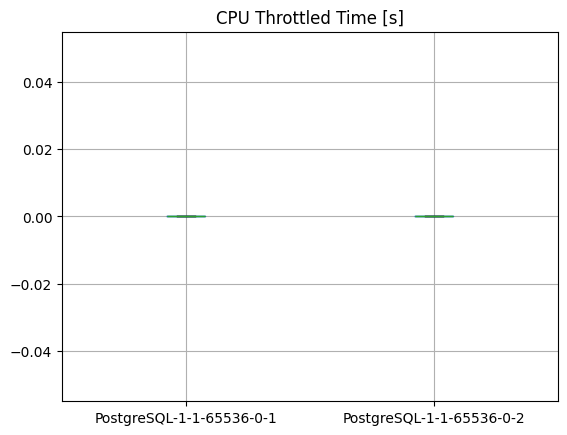

...

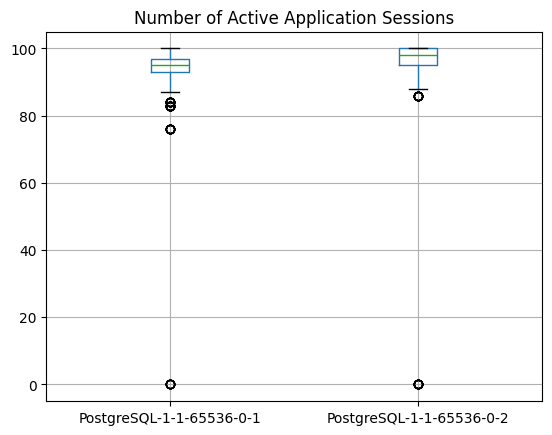

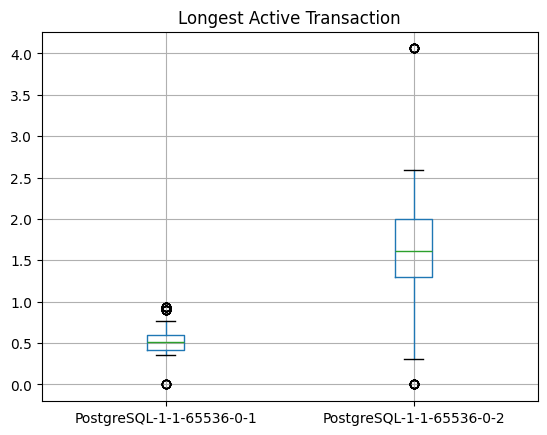

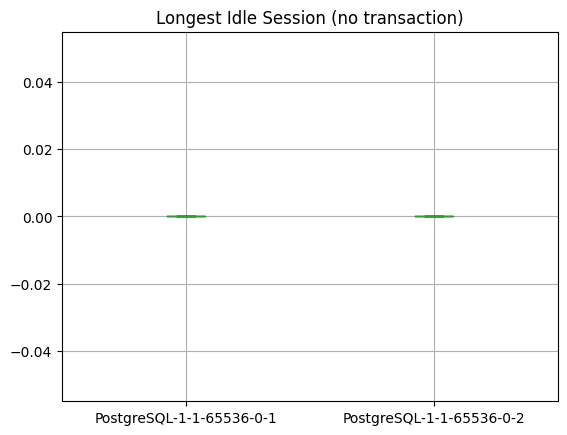

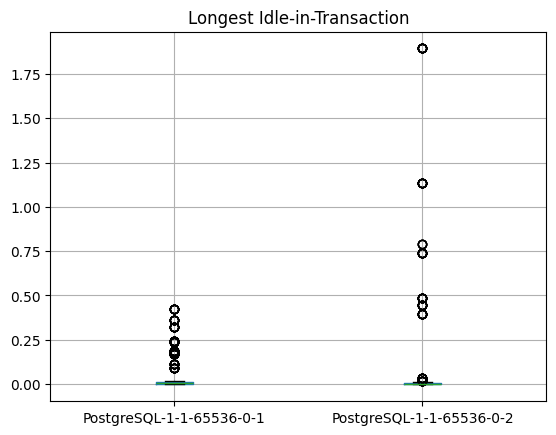

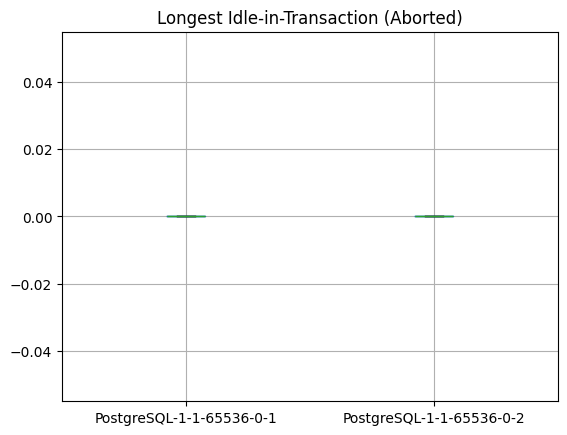

/home/perdelt/anaconda3/envs/dbmsbenchmarker/lib/python3.11/site-packages/numpy/lib/function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/perdelt/anaconda3/envs/dbmsbenchmarker/lib/python3.11/site-packages/matplotlib/cbook.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/perdelt/anaconda3/envs/dbmsbenchmarker/lib/python3.11/site-packages/matplotlib/cbook.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/perdelt/anaconda3/envs/dbmsbenchmarker/lib/python3.11/site-packages/matplotlib/cbook.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],
/home/perdelt/anaconda3/envs/dbmsbenchmarker/lib/python3.11/site-packages/matplotlib/cbook.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],


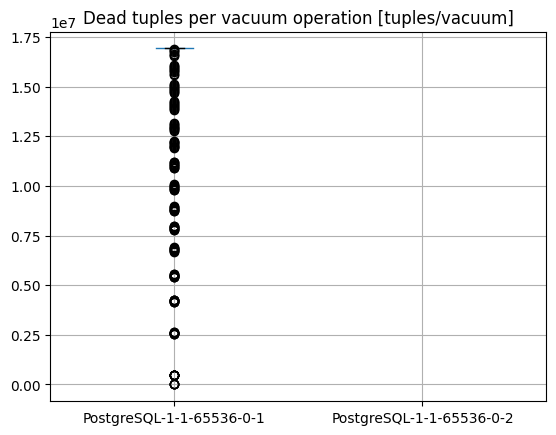

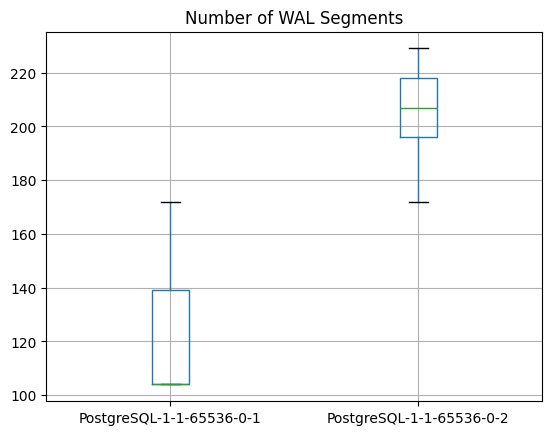

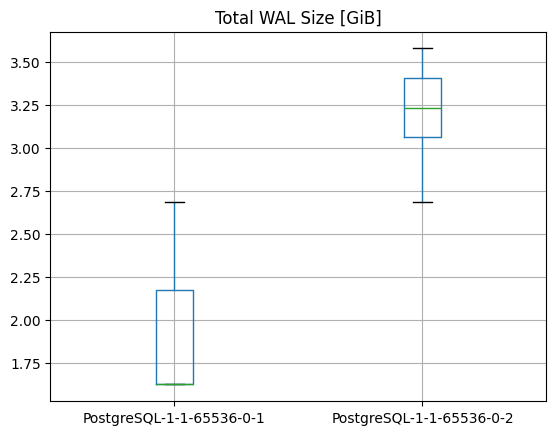

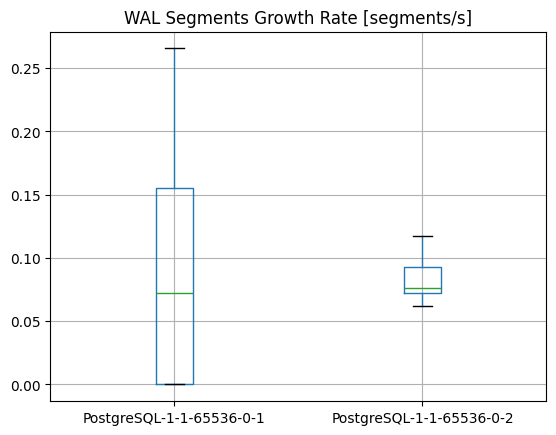

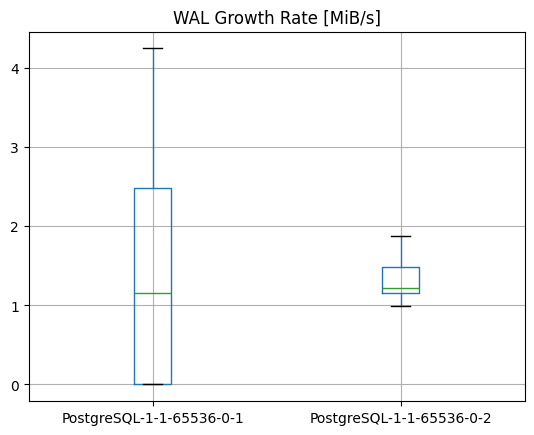

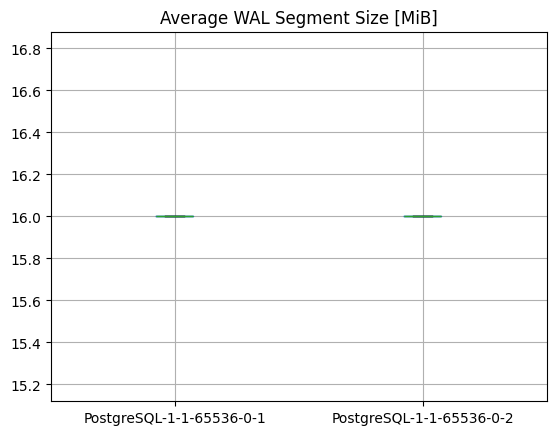

In [9]:
results = []
code = codes[0]
for idx, row in collect.df_metrics.iterrows():
    if row["active"] == False:
        continue
    #print(idx, row["title"])
    metric_name = idx
    method = 'diff' if row["metric"] == 'counter' else 'mean'
    col_name = row["title"]
    df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric_name)
    #print(df_monitoring)
    #plot_boxplots(df_monitoring, y=metric_name, title=col_name)
    ax = df_monitoring.boxplot()
    ax.set_title(col_name)
    plt.show()
    #plot_boxplots(df_performance_first, y='value', title=collect.df_metrics.loc[metric]['title'])

# Boxplot of A Single Metric for a Single Experiment

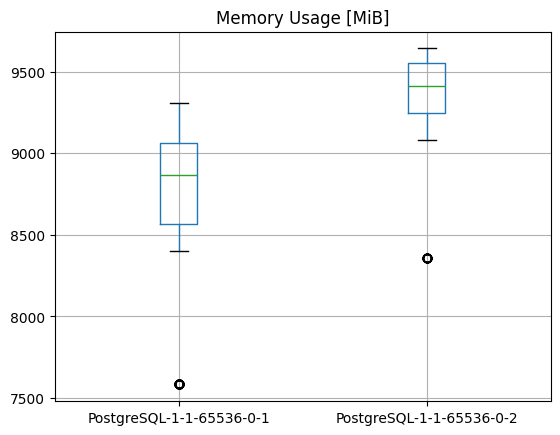

In [10]:
metric = 'pg_stat_activity_max_tx_duration_active'
#metric = 'pg_stat_database_blks_reads'
#metric = 'pg_stat_activity_count_idle_transaction'
metric = 'total_cpu_memory'
code = codes[0]
df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric)

#df_monitoring.plot(title=metric)
#df_monitoring.boxplot()
ax = df_monitoring.boxplot()
ax.set_title(collect.df_metrics.loc[metric]['title'])#metric)
plt.show()

# Lineplot of a Single Metric for a Single Experiment

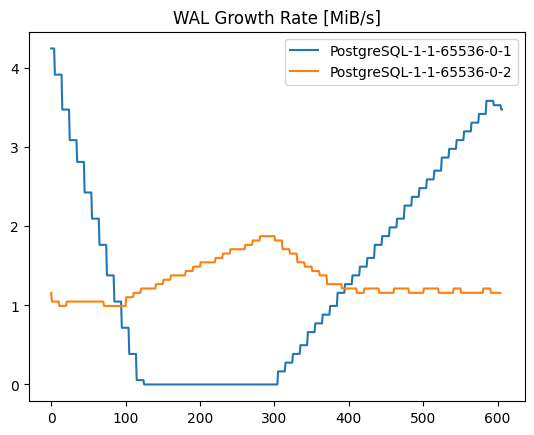

In [11]:
metric = 'pg_stat_database_blks_hit'
metric = 'pg_stat_activity_count_idle_transaction'
metric = 'total_cpu_memory'
metric = 'total_cpu_util'
metric = 'total_cpu_util_s'
metric = 'core_variance'
metric = 'max_core_util'
metric = 'pg_stat_activity_max_tx_duration_lock'
metric = 'pg_wal_size_rate'

code = codes[0]
df_monitoring = collect.get_monitoring_timeseries_single(code, metric=metric)

#df_monitoring.plot(title=metric)
ax = df_monitoring.plot()
ax.set_title(collect.df_metrics.loc[metric]['title'])
plt.show()
#df_monitoring

# Boxplot of a Single Metric for all Experiments

In [12]:
metric = 'pg_stat_database_blks_hit'
metric = 'pg_stat_activity_count_idle_transaction'
metric = 'total_cpu_memory'
metric = 'total_cpu_util'
metric = 'total_cpu_util_s'
metric = 'core_variance'
metric = 'pg_stat_activity_count_active'
#metric = 'pg_locks_count_exclusivelock'

df_performance = collect.get_monitoring_timeseries_all(metric)
#df_performance
df_performance_first = df_performance[df_performance['client']=="1"]
#df_performance_first
df_performance_second = df_performance[df_performance['client']=="2"]
#df_performance_second
#df_performance_first['value'].describe()

## First Execution Run

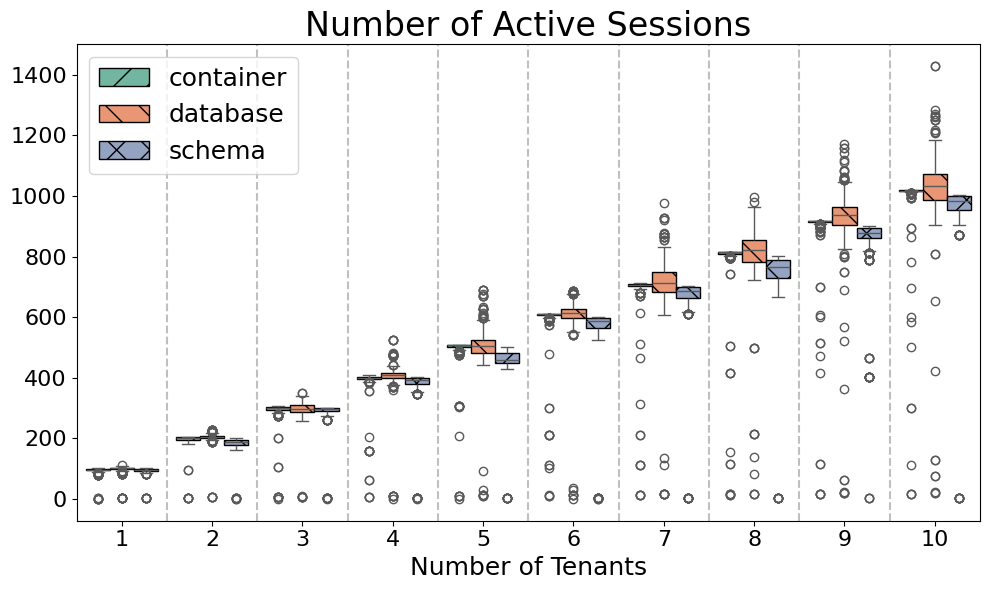

In [13]:
plot_boxplots(df_performance_first, y='value', title=collect.df_metrics.loc[metric]['title'])

## Second Execution Run

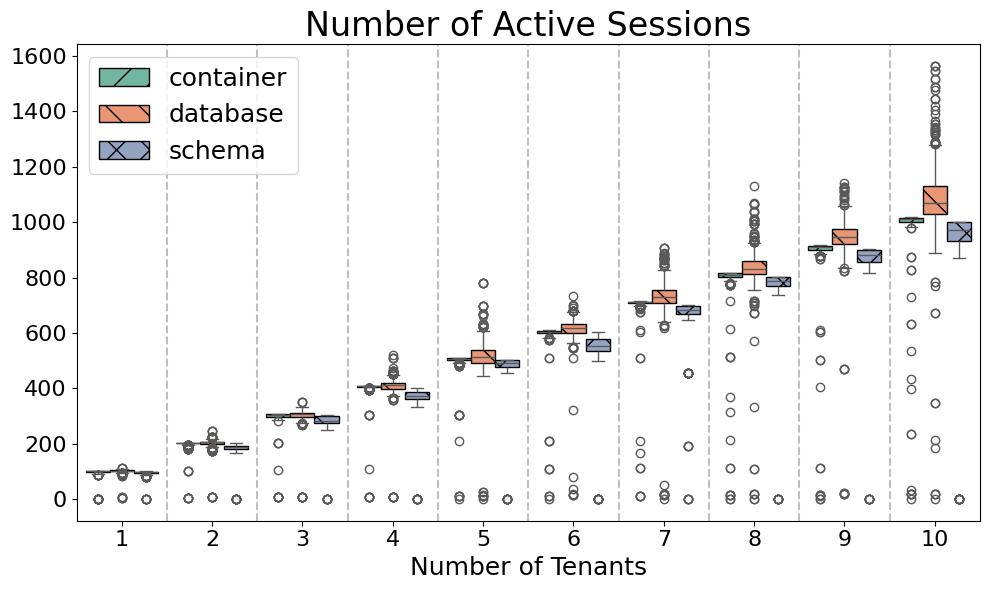

In [14]:
plot_boxplots(df_performance_second, y='value', title=collect.df_metrics.loc[metric]['title'])

# Lineplot of a Single Metric for All Experiments

## First Execution Run

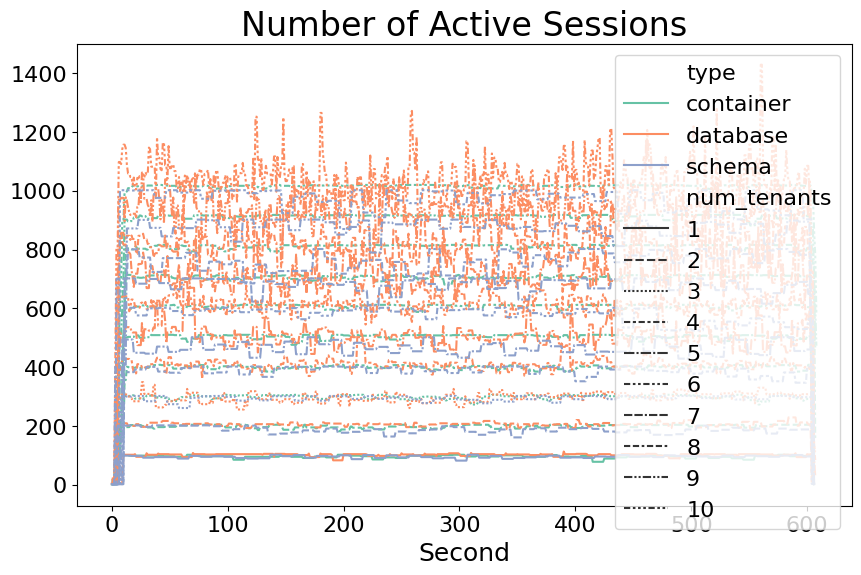

In [15]:
#df = df_performance_first[df_performance_first['type'] == 'database']
plot_lines(df_performance_first, y='value', title=collect.df_metrics.loc[metric]['title'])

# Aggregated Data for all Clients

In [16]:
df_performance = collect.get_monitoring_single_all("stream")
df_performance

,Memory Usage [MiB],Memory Usage Cached [MiB],CPU Utilization,CPU Throttle,CPU Throttled Time [s],CPU Utilization Time [s],CPU User Time [s],CPU System Time [s],Network Rx Total [MiB],Network Tx Total [MiB],...,Dead tuples per vacuum operation [tuples/vacuum],Number of WAL Segments,Total WAL Size [GiB],WAL Segments Growth Rate [segments/s],WAL Growth Rate [MiB/s],Average WAL Segment Size [MiB],client,type,num_tenants,code
PostgreSQL-1-1-65536-0-1,8748.56,10169.12,4.31,0.0,0.0,2816.69,1658.91,1157.78,5142.92,4675.72,...,inf,121.49,1.90,0.09,1.38,16.0,1,container,1,1758279829
PostgreSQL-1-1-65536-0-2,9353.81,11328.60,1.81,0.0,0.0,1137.55,673.96,463.59,2807.06,2223.06,...,inf,205.70,3.21,0.08,1.31,16.0,2,container,1,1758279829
PostgreSQL-1-1-65536-1,8457.75,9672.74,1.49,0.0,0.0,971.19,567.91,403.29,1775.65,1611.76,...,inf,104.00,1.62,0.01,0.19,16.0,1,database,1,1758277451
PostgreSQL-1-1-65536-2,8740.95,10225.59,1.48,0.0,0.0,952.14,551.08,401.07,1777.00,1777.73,...,inf,113.76,1.78,0.03,0.50,16.0,2,database,1,1758277451
PostgreSQL-1-1-65536-1,8788.90,10214.40,4.40,0.0,0.0,2764.95,1640.10,1124.85,5253.70,4400.99,...,inf,122.12,1.91,0.09,1.40,16.0,1,schema,1,1758275241
PostgreSQL-1-1-65536-2,9615.85,11751.46,4.45,0.0,0.0,2736.07,1623.86,1112.21,4285.61,4286.67,...,inf,239.65,3.74,0.17,2.76,16.0,2,schema,1,1758275241
PostgreSQL-1-1-65536-0-1,8436.91,9644.96,1.60,0.0,0.0,1007.12,587.17,419.94,1659.01,1660.37,...,inf,104.00,1.62,0.00,0.00,16.0,1,container,2,1758287255
PostgreSQL-1-1-65536-0-2,8558.33,9941.19,0.71,0.0,0.0,463.48,272.29,191.19,835.85,838.07,...,inf,104.00,1.62,0.00,0.00,16.0,2,container,2,1758287255
PostgreSQL-1-1-65536-1-1,8443.13,9654.73,1.58,0.0,0.0,957.97,558.86,399.11,1681.42,1683.03,...,inf,104.00,1.62,0.00,0.00,16.0,1,container,2,1758287255
PostgreSQL-1-1-65536-1-2,8564.05,9950.81,0.77,0.0,0.0,480.00,276.36,203.64,866.56,871.42,...,inf,104.00,1.62,0.00,0.00,16.0,2,container,2,1758287255


# Monitoring Aggregated Values

In [17]:
df_performance = collect.get_monitoring_all("stream")

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance.T#[['Max CPU', 'client', 'type', 'num_tenants']]

,0,1,0,1,0,1,0,1,0,1,...,0,1,0,1,0,1,0,1,0,1
client,1,2,1,2,1,2,1,2,1,2,...,1,2,1,2,1,2,1,2,1,2
Memory Usage [MiB],8748.56,9353.81,8457.75,8740.95,8788.9,9615.85,16880.04,17122.38,10683.17,11299.59,...,29698.02,31314.69,27740.33,30815.97,81572.31,82470.27,32079.79,34731.8,30101.18,35060.26
Memory Usage Cached [MiB],10169.12,11328.6,9672.74,10225.59,10214.4,11751.46,19299.69,19892.0,13070.5,14206.79,...,40532.28,44177.46,38040.68,43063.32,92403.56,93898.79,44071.7,49519.05,41536.52,49223.07
CPU Utilization,4.31,1.81,1.49,1.48,4.4,4.45,3.18,1.48,3.12,4.2,...,17.62,12.84,12.27,13.55,2.26,4.82,25.34,15.22,15.3,18.87
CPU Throttle,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Throttled Time [s],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Utilization Time [s],2816.69,1137.55,971.19,952.14,2764.95,2736.07,1965.09,943.48,1971.96,2872.42,...,10847.63,7825.67,7556.86,8366.83,1435.88,3115.68,15721.54,10122.07,10185.66,12727.6
CPU User Time [s],1658.91,673.96,567.91,551.08,1640.1,1623.86,1146.03,548.65,1146.96,1641.89,...,6383.32,4472.69,4338.91,4805.45,867.88,1735.47,9536.34,6099.83,5999.88,7552.49
CPU System Time [s],1157.78,463.59,403.29,401.07,1124.85,1112.21,819.05,394.83,825.0,1230.53,...,4464.31,3352.98,3217.96,3561.38,568.01,1380.24,6185.2,4022.24,4185.78,5175.11
Network Rx Total [MiB],5142.92,2807.06,1775.65,1777.0,5253.7,4285.61,3340.43,1702.41,3229.25,4505.97,...,16174.33,9741.13,11206.08,12032.8,1676.89,4259.83,22155.39,13174.91,13441.21,16498.65


## First Execution Run

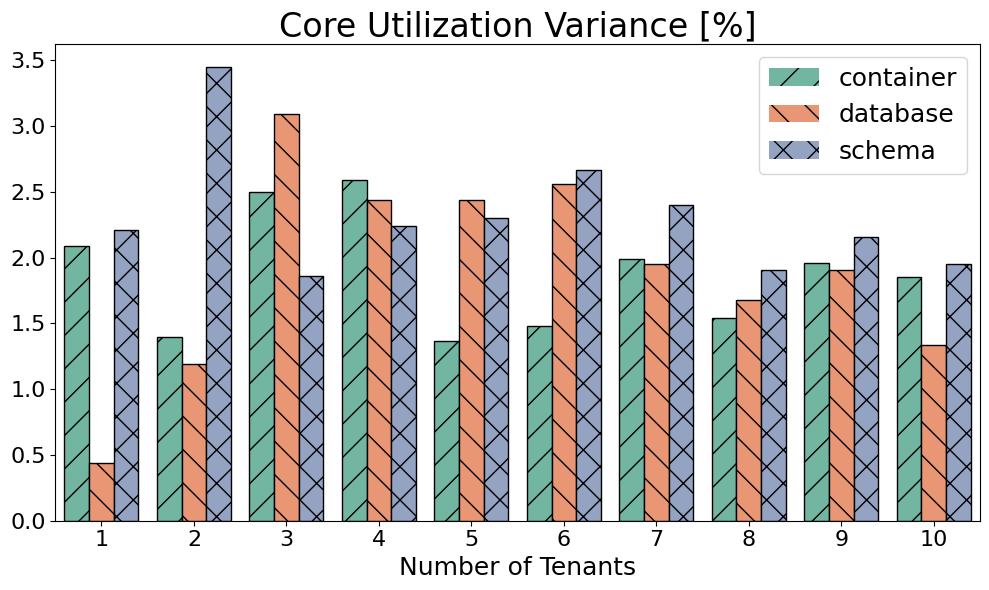

In [18]:
plot_bars(df_performance_first, y='Core Utilization Variance [%]', title='Core Utilization Variance [%]', estimator='max')

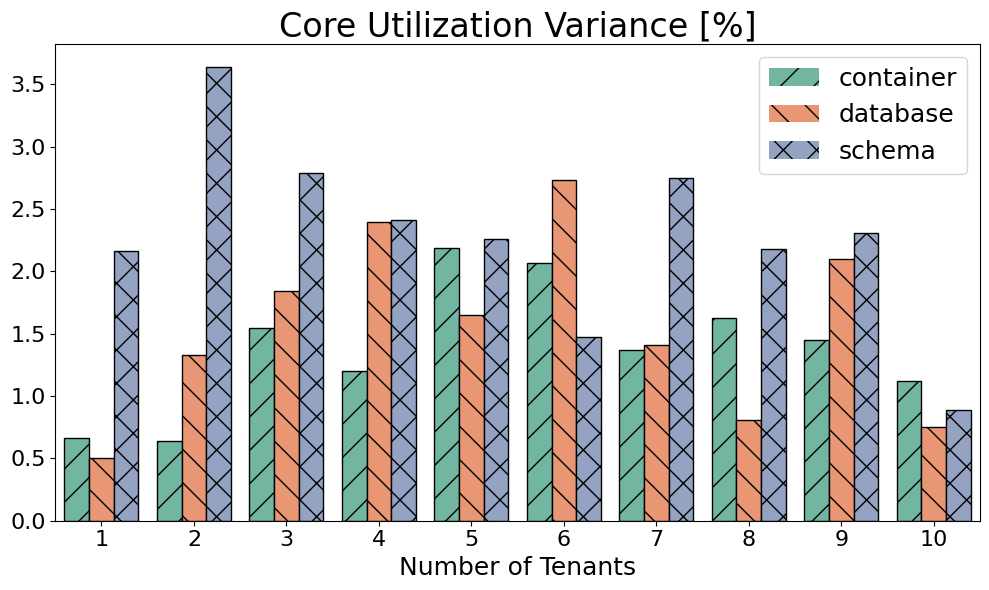

In [19]:
plot_bars(df_performance_second, y='Core Utilization Variance [%]', title='Core Utilization Variance [%]', estimator='max')

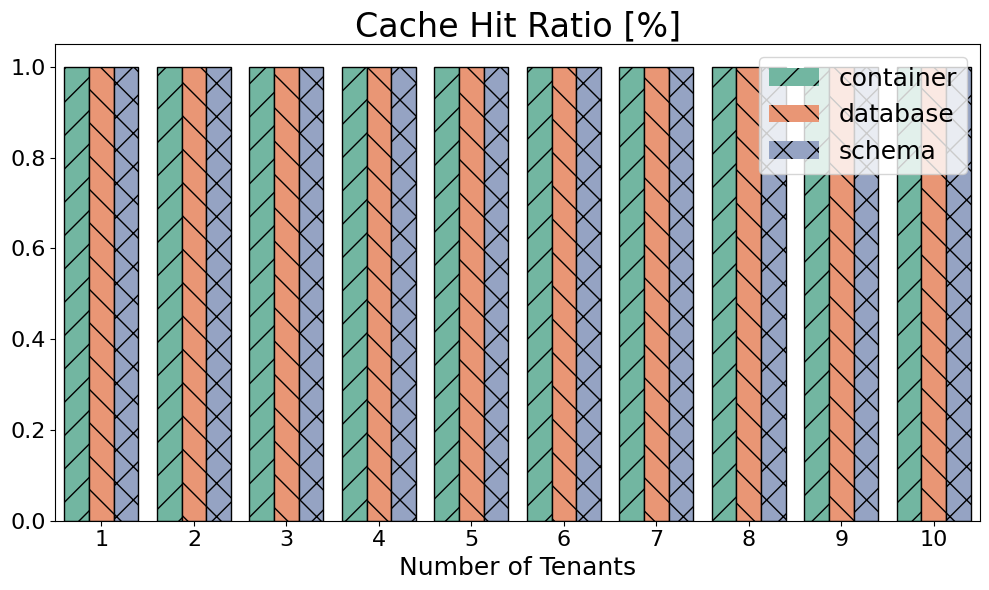

In [20]:
plot_bars(df_performance_first, y='Buffer Cache Hit Ratio', title='Cache Hit Ratio [%]', estimator='min')

## Second Execution Run

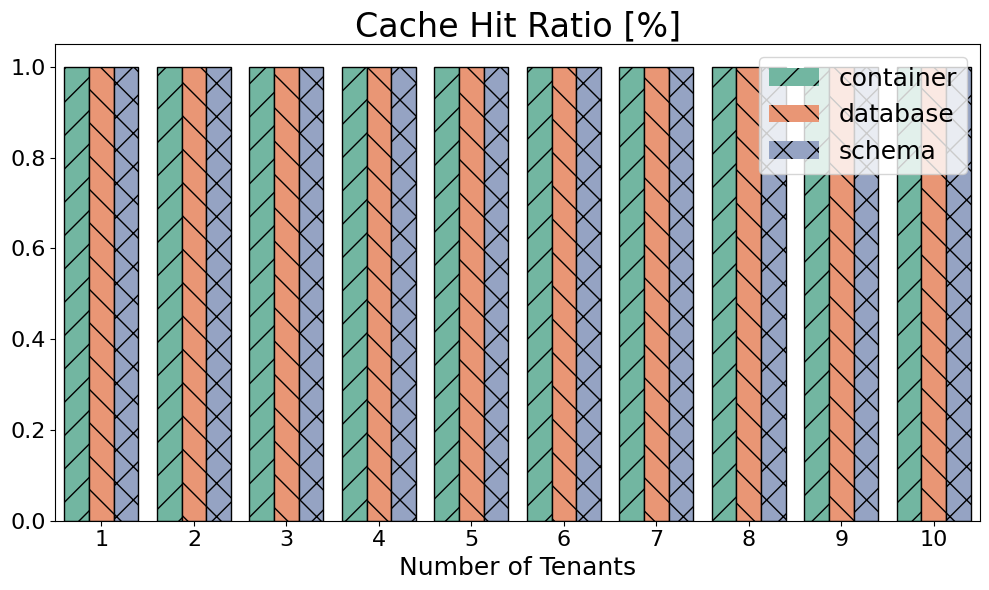

In [21]:
plot_bars(df_performance_second, y='Buffer Cache Hit Ratio', title='Cache Hit Ratio [%]', estimator='min')

# Performance Results per Tenant

In [22]:
df_performance = collect.get_performance_all_single()

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance

,connection,configuration,experiment_run,client,pod,pod_count,bench,profile,target,time,...,Latency Distribution.Median Latency (microseconds),Latency Distribution.Minimum Latency (microseconds),Latency Distribution.25th Percentile Latency (microseconds),Latency Distribution.90th Percentile Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),Latency Distribution.75th Percentile Latency (microseconds),Latency Distribution.Average Latency (microseconds),type,num_tenants,code
connection_pod,,,,,,,,,,,,,,,,,,,,,
PostgreSQL-1-1-65536-0-1-1,PostgreSQL-1-1-65536-0-1,PostgreSQL-1-1-65536-0,1,1,qdt8b.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,26889,831,25336,206175,493516,103097,79791,container,1,1758279829
PostgreSQL-1-1-65536-0-2-1,PostgreSQL-1-1-65536-0-2,PostgreSQL-1-1-65536-0,1,2,8z2vp.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,58762,892,38455,530858,1327940,238691,188398,container,1,1758279829
PostgreSQL-1-1-65536-1-1,PostgreSQL-1-1-65536-1,PostgreSQL-1-1-65536,1,1,9rtfw.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,59605,845,50563,625213,1403192,321081,229086,database,1,1758277451
PostgreSQL-1-1-65536-2-1,PostgreSQL-1-1-65536-2,PostgreSQL-1-1-65536,1,2,7csn9.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,58892,902,50021,574938,1312967,286215,208397,database,1,1758277451
PostgreSQL-1-1-65536-1-1,PostgreSQL-1-1-65536-1,PostgreSQL-1-1-65536,1,1,2hhcj.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,27121,852,25415,205260,479796,102774,78933,schema,1,1758275241
PostgreSQL-1-1-65536-2-1,PostgreSQL-1-1-65536-2,PostgreSQL-1-1-65536,1,2,cxtsv.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,26564,788,25365,205985,494814,102468,79423,schema,1,1758275241
PostgreSQL-1-1-65536-0-1-1,PostgreSQL-1-1-65536-0-1,PostgreSQL-1-1-65536-0,1,1,rclv9.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,91630,885,45712,699284,1868995,313731,255894,container,2,1758287255
PostgreSQL-1-1-65536-1-1-1,PostgreSQL-1-1-65536-1-1,PostgreSQL-1-1-65536-1,1,1,fvbtr.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,87713,862,44853,687252,1856397,309496,252276,container,2,1758287255
PostgreSQL-1-1-65536-0-2-1,PostgreSQL-1-1-65536-0-2,PostgreSQL-1-1-65536-0,1,2,224k8.dbmsbenchmarker,1,tpcc,postgres,65536,600,...,129487,927,100377,1304071,2855031,692004,480787,container,2,1758287255


## First Execution Run

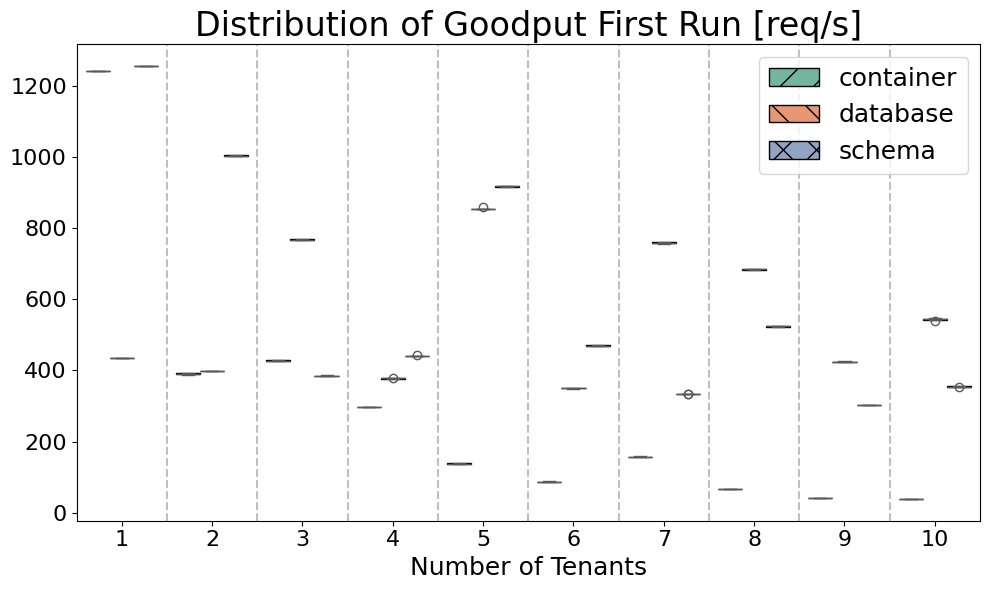

In [23]:
plot_boxplots(df_performance_first, y='Goodput (requests/second)', title='Distribution of Goodput First Run [req/s]')

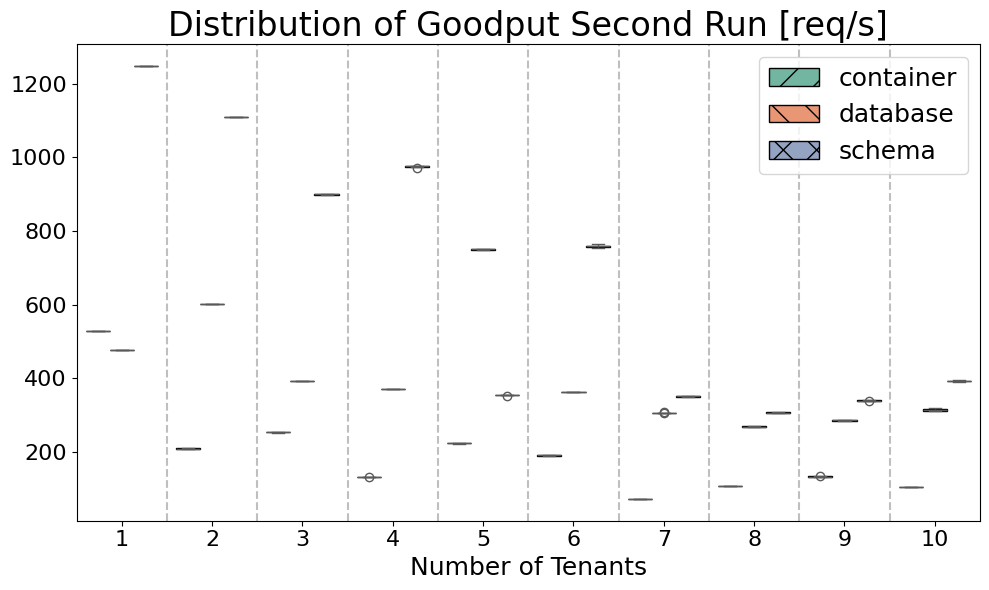

In [24]:
plot_boxplots(df_performance_second, y='Goodput (requests/second)', title='Distribution of Goodput Second Run [req/s]')

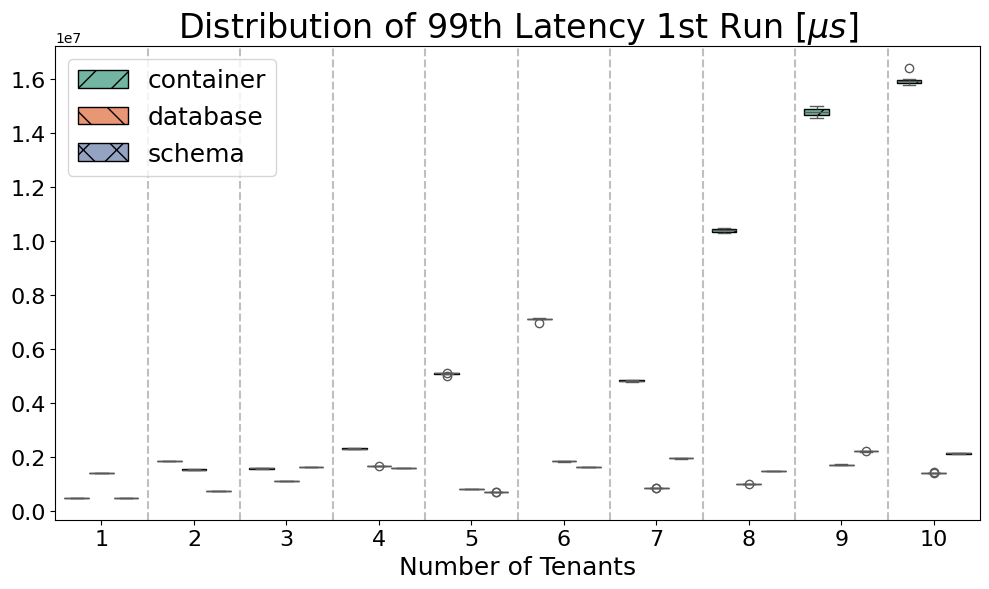

In [25]:
plot_boxplots(df_performance_first, y='Latency Distribution.99th Percentile Latency (microseconds)', title='Distribution of 99th Latency 1st Run [$\mu s$]')

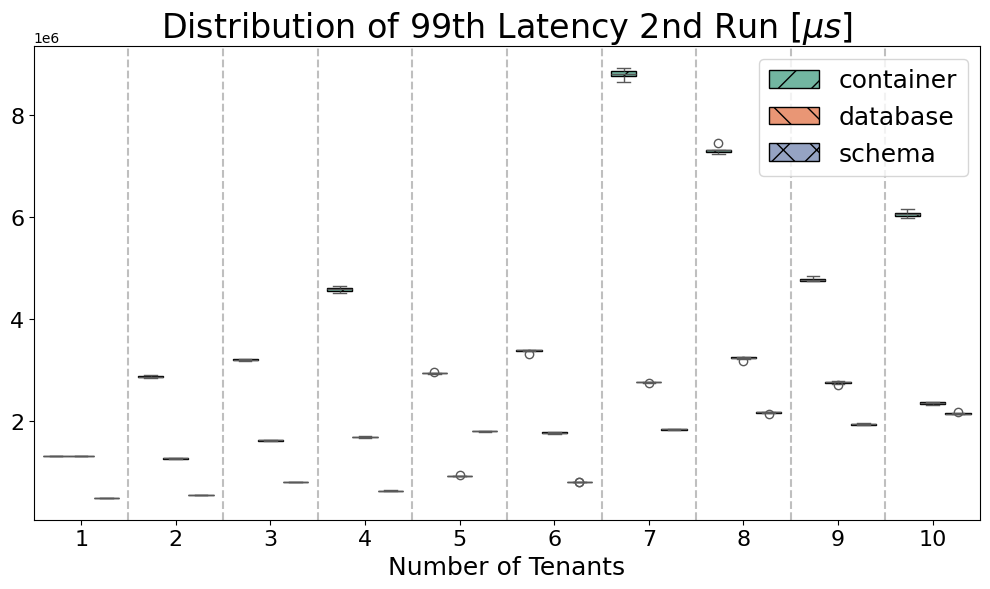

In [26]:
plot_boxplots(df_performance_second, y='Latency Distribution.99th Percentile Latency (microseconds)', title='Distribution of 99th Latency 2nd Run [$\mu s$]')

# Performance Results per Total

In [27]:
df_performance = collect.get_performance_all()

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance.dropna(inplace=True)

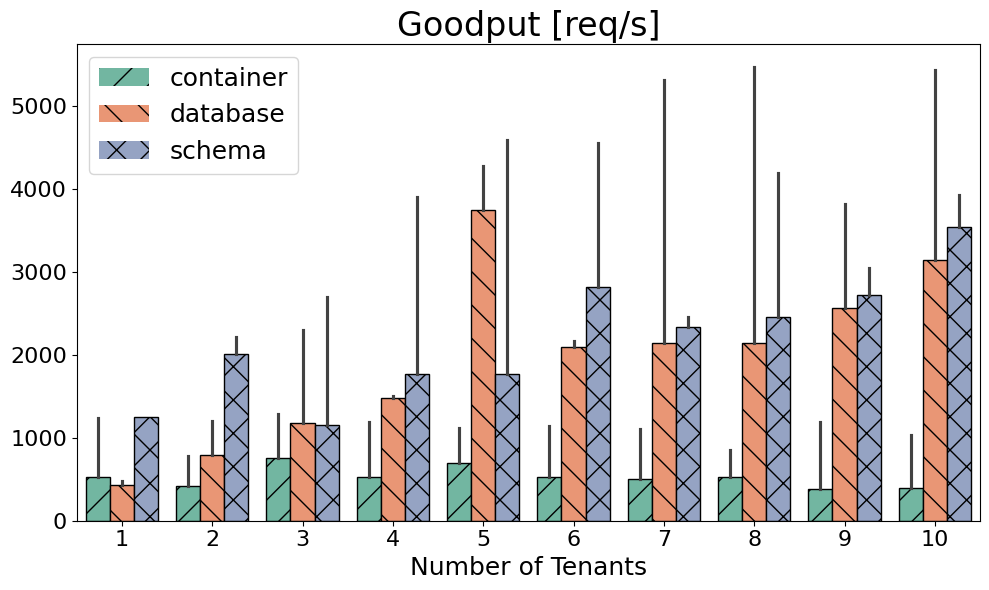

In [28]:
plot_bars(df_performance, y='Goodput (requests/second)', title='Goodput [req/s]', estimator='min')

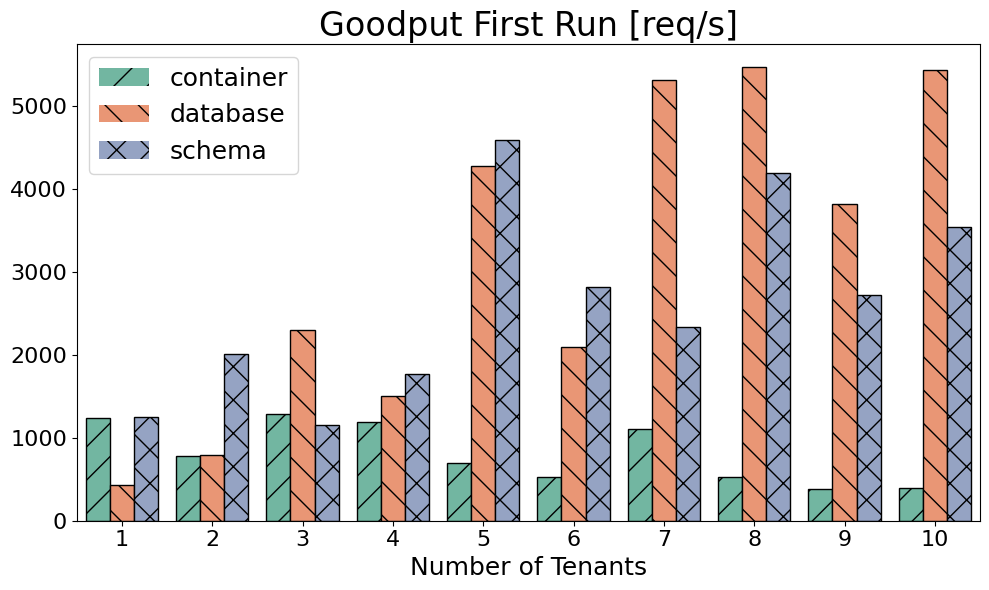

In [29]:
plot_bars(df_performance_first, y='Goodput (requests/second)', title='Goodput First Run [req/s]', estimator='min')

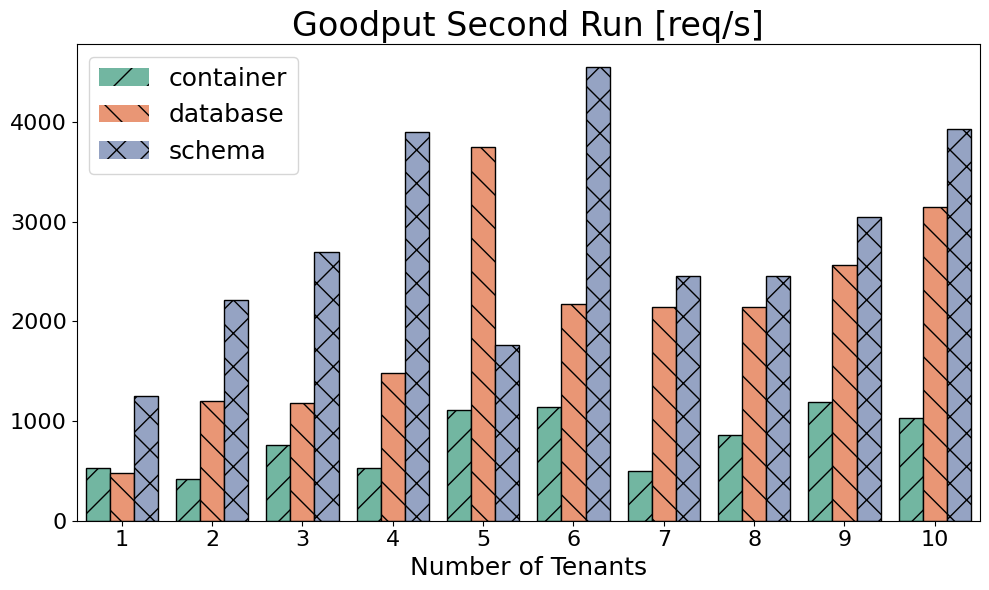

In [30]:
plot_bars(df_performance_second, y='Goodput (requests/second)', title='Goodput Second Run [req/s]', estimator='min')

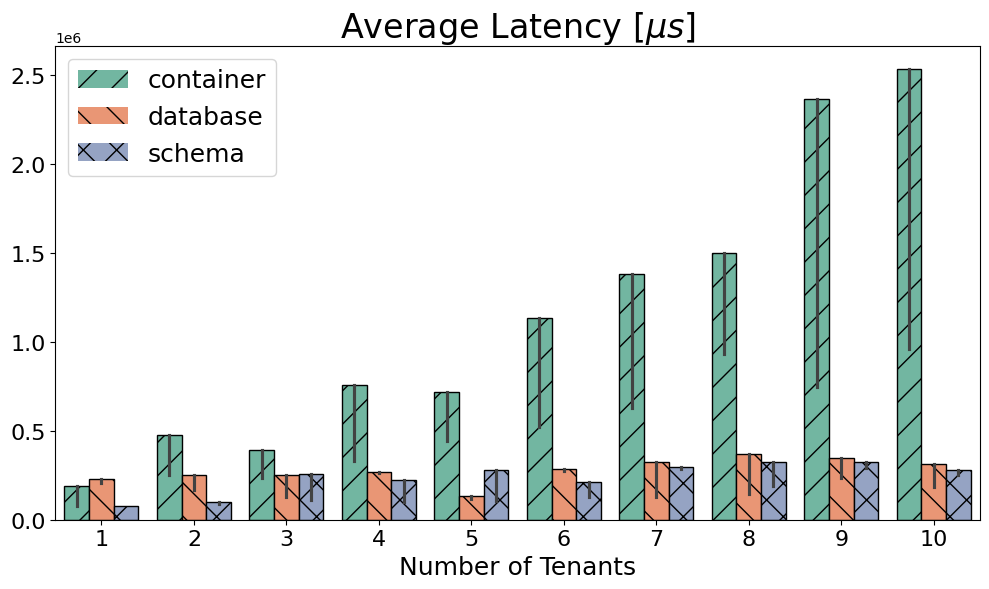

In [31]:
plot_bars(df_performance, y='Latency Distribution.Average Latency (microseconds)', title='Average Latency [$\mu s$]', estimator='max')

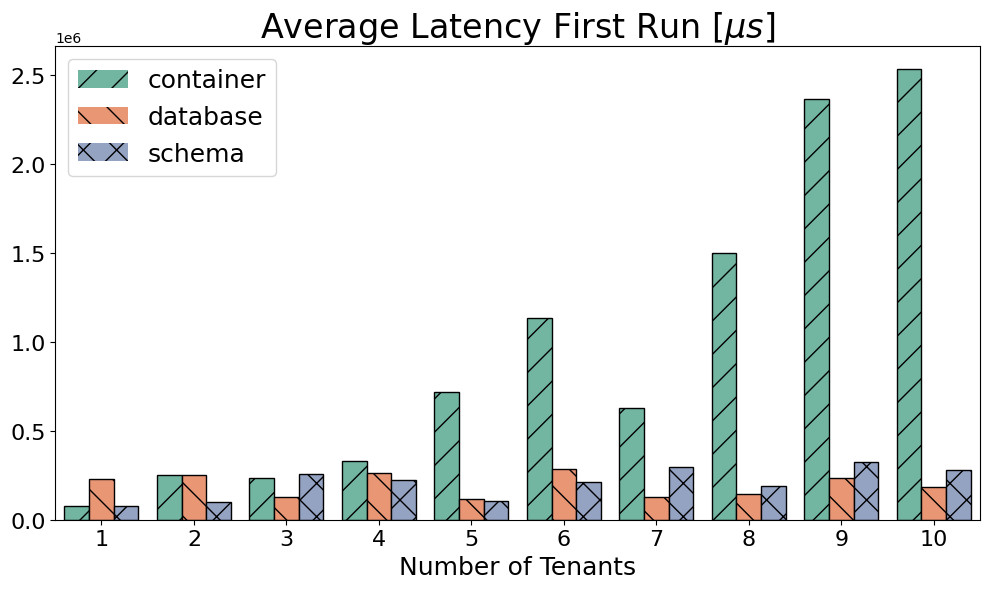

In [32]:
plot_bars(df_performance_first, y='Latency Distribution.Average Latency (microseconds)', title='Average Latency First Run [$\mu s$]', estimator='max')

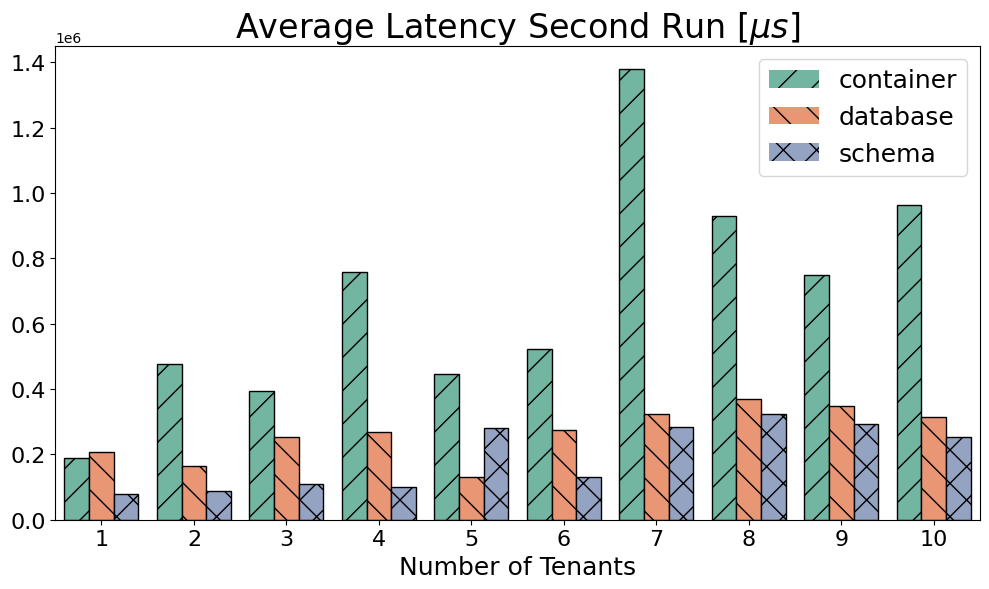

In [33]:
plot_bars(df_performance_second, y='Latency Distribution.Average Latency (microseconds)', title='Average Latency Second Run [$\mu s$]', estimator='max')

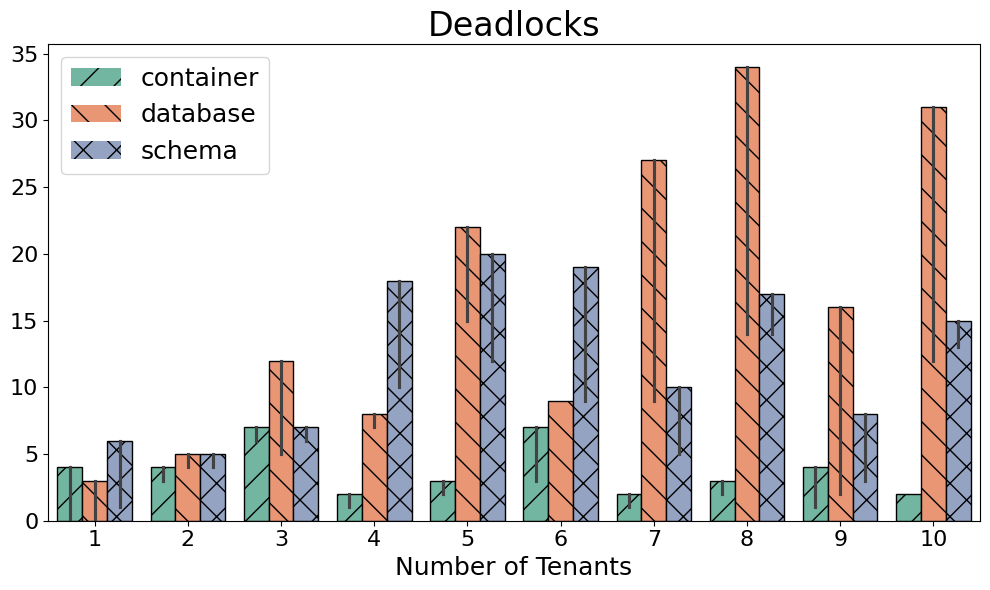

In [34]:
plot_bars(df_performance, y='num_errors', title='Deadlocks', estimator='max')

In [35]:
df_performance = collect.get_loading_time_max_all()

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance

,time_load,time_ingest,time_check,terminals,pods,tenant,client,datadisk,type,num_tenants,code
PostgreSQL-1-1-65536-0-1,442.0,175.0,262.0,1,1,0,1,2719,container,1,1758279829
PostgreSQL-1-1-65536-0-2,442.0,175.0,262.0,1,1,0,2,4553,container,1,1758279829
PostgreSQL-1-1-65536-1,754.0,320.0,427.0,1,1,,1,2727,database,1,1758277451
PostgreSQL-1-1-65536-2,754.0,320.0,427.0,1,1,,2,3025,database,1,1758277451
PostgreSQL-1-1-65536-1,450.0,183.0,259.0,1,1,,1,2719,schema,1,1758275241
PostgreSQL-1-1-65536-2,450.0,183.0,259.0,1,1,,2,4593,schema,1,1758275241
PostgreSQL-1-1-65536-0-1,706.0,258.0,444.0,1,1,0,1,2719,container,2,1758287255
PostgreSQL-1-1-65536-0-2,706.0,258.0,444.0,1,1,0,2,2990,container,2,1758287255
PostgreSQL-1-1-65536-1-1,682.0,257.0,421.0,1,1,1,1,2719,container,2,1758287255
PostgreSQL-1-1-65536-1-2,682.0,257.0,421.0,1,1,1,2,2992,container,2,1758287255


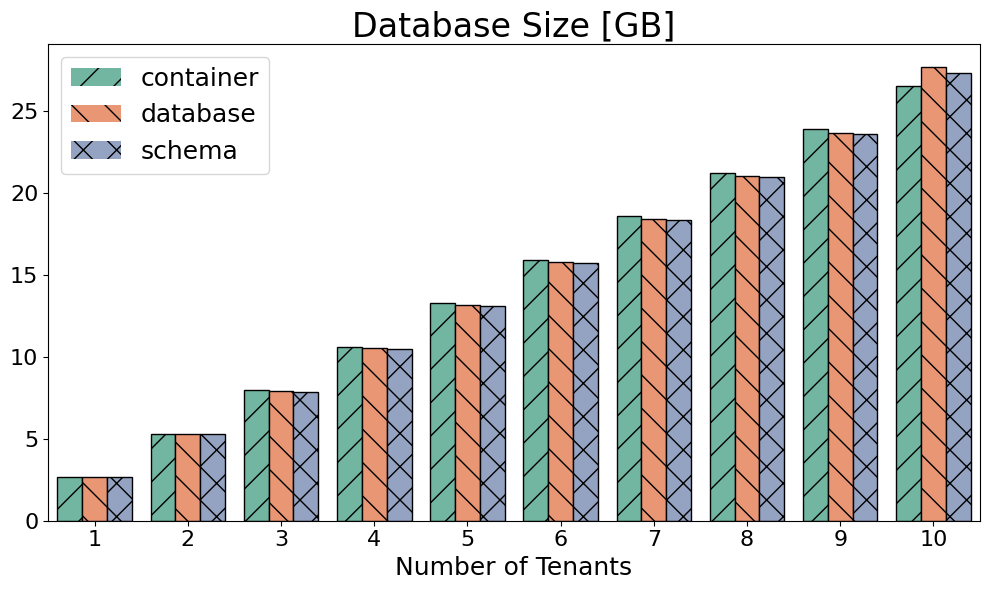

In [36]:
df_performance_first = df_performance[df_performance['client'] == '1']
# Divide datadisk by the count of rows with the same type and num_tenants
df = df_performance_first.copy()
# Create a mask for rows where type is not "container"
mask = df['type'] != 'container'

# Only apply the group count to the relevant rows
group_counts = df[mask].groupby(['type', 'num_tenants'])['datadisk'].transform('count')

# Initialize the column with NaN (or 0, if preferred)
df['datadisk_normalized'] = df['datadisk'] / 1024

# Apply the normalized value only where the mask is True
df.loc[mask, 'datadisk_normalized'] = df.loc[mask, 'datadisk'] / group_counts / 1024

plot_bars(df, y='datadisk_normalized', title='Database Size [GB]', estimator='sum')

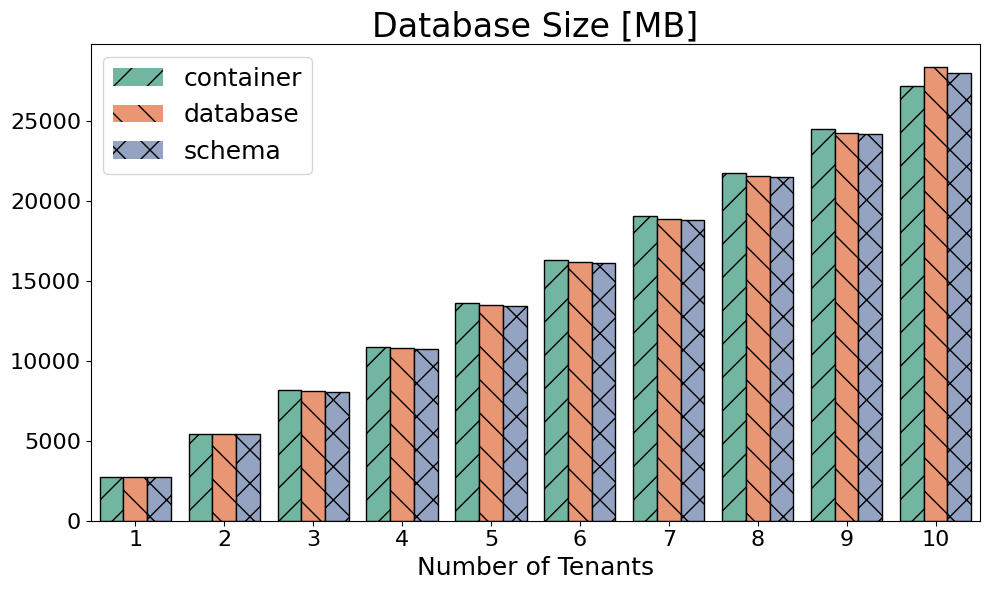

In [37]:
plot_bars(df_performance_first, y='datadisk', title='Database Size [MB]', estimator='sum')

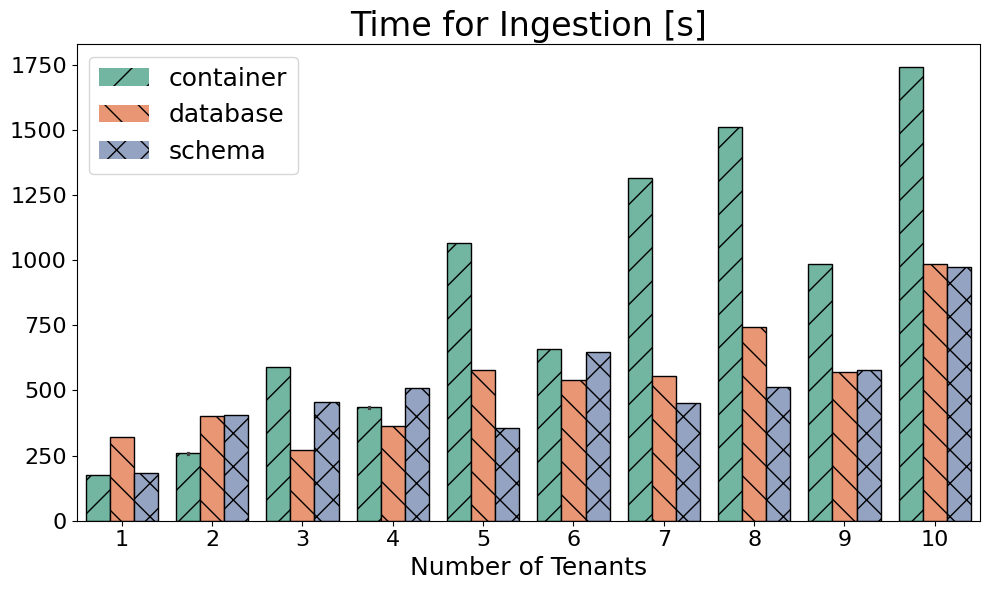

In [38]:
plot_bars(df_performance_first, y='time_ingest', title='Time for Ingestion [s]', estimator='max')

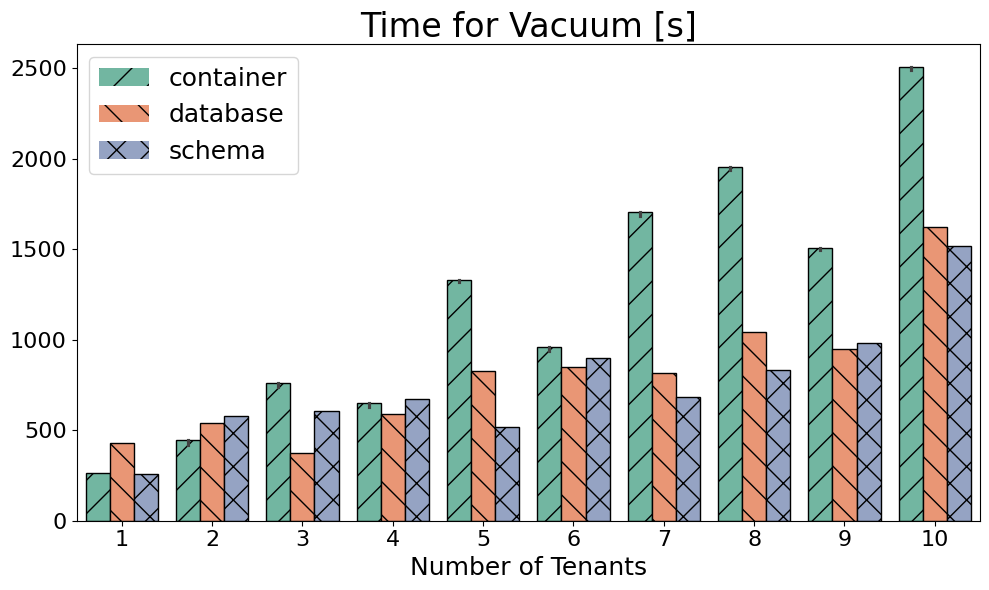

In [39]:
plot_bars(df_performance_first, y='time_check', title='Time for Vacuum [s]', estimator='max')

# Hardware Monitoring for Benchmarking Phase

In [40]:
df_performance = collect.get_monitoring_all(type="stream")

df_performance_first = df_performance[df_performance['client']=='1']
df_performance_second = df_performance[df_performance['client']=='2']

df_performance.T

,0,1,0,1,0,1,0,1,0,1,...,0,1,0,1,0,1,0,1,0,1
client,1,2,1,2,1,2,1,2,1,2,...,1,2,1,2,1,2,1,2,1,2
Memory Usage [MiB],8748.56,9353.81,8457.75,8740.95,8788.9,9615.85,16880.04,17122.38,10683.17,11299.59,...,29698.02,31314.69,27740.33,30815.97,81572.31,82470.27,32079.79,34731.8,30101.18,35060.26
Memory Usage Cached [MiB],10169.12,11328.6,9672.74,10225.59,10214.4,11751.46,19299.69,19892.0,13070.5,14206.79,...,40532.28,44177.46,38040.68,43063.32,92403.56,93898.79,44071.7,49519.05,41536.52,49223.07
CPU Utilization,4.31,1.81,1.49,1.48,4.4,4.45,3.18,1.48,3.12,4.2,...,17.62,12.84,12.27,13.55,2.26,4.82,25.34,15.22,15.3,18.87
CPU Throttle,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Throttled Time [s],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CPU Utilization Time [s],2816.69,1137.55,971.19,952.14,2764.95,2736.07,1965.09,943.48,1971.96,2872.42,...,10847.63,7825.67,7556.86,8366.83,1435.88,3115.68,15721.54,10122.07,10185.66,12727.6
CPU User Time [s],1658.91,673.96,567.91,551.08,1640.1,1623.86,1146.03,548.65,1146.96,1641.89,...,6383.32,4472.69,4338.91,4805.45,867.88,1735.47,9536.34,6099.83,5999.88,7552.49
CPU System Time [s],1157.78,463.59,403.29,401.07,1124.85,1112.21,819.05,394.83,825.0,1230.53,...,4464.31,3352.98,3217.96,3561.38,568.01,1380.24,6185.2,4022.24,4185.78,5175.11
Network Rx Total [MiB],5142.92,2807.06,1775.65,1777.0,5253.7,4285.61,3340.43,1702.41,3229.25,4505.97,...,16174.33,9741.13,11206.08,12032.8,1676.89,4259.83,22155.39,13174.91,13441.21,16498.65


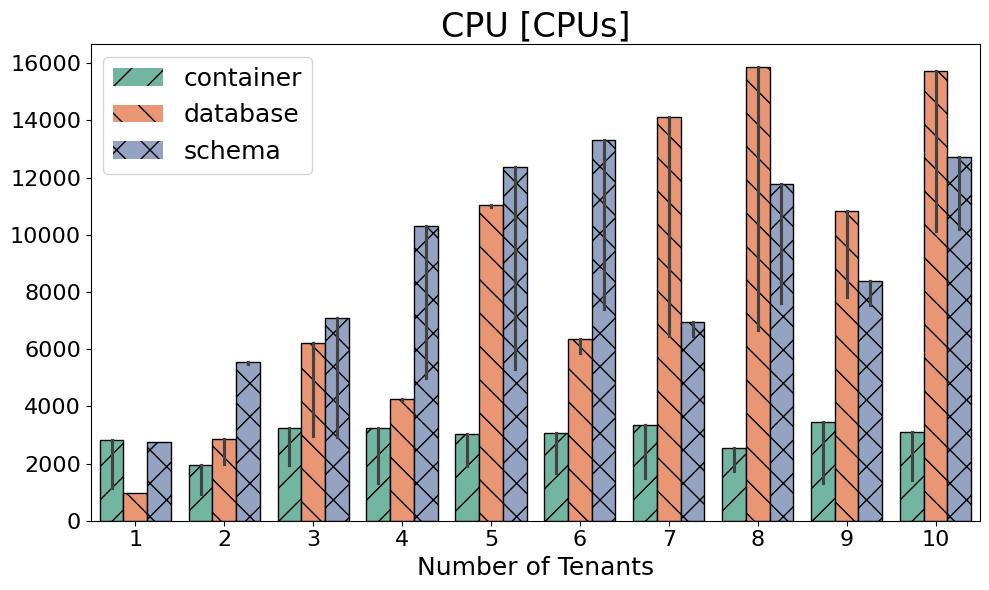

In [41]:
plot_bars(df_performance, y='CPU Utilization Time [s]', title='CPU [CPUs]', estimator='max')

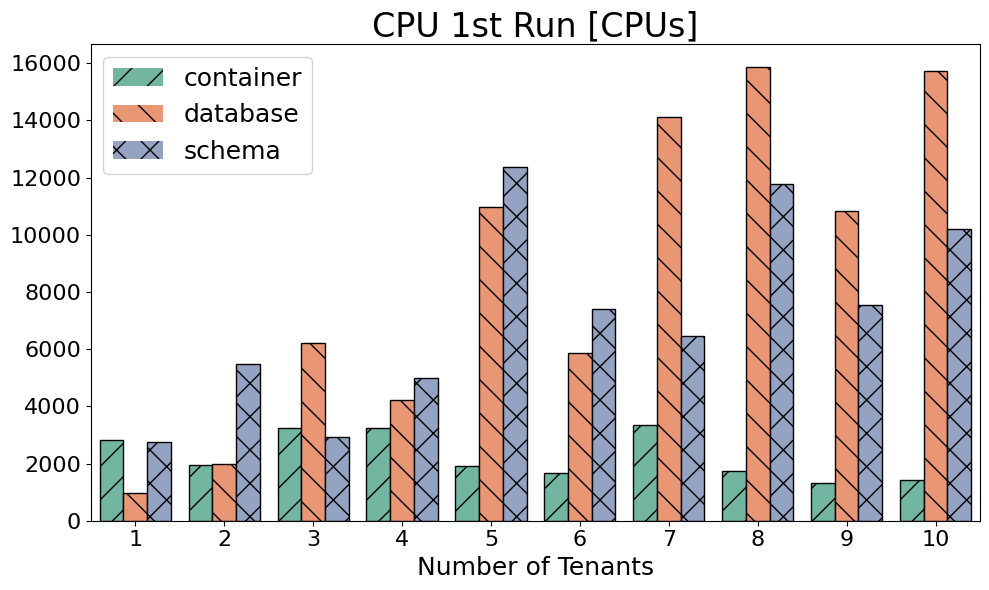

In [42]:
plot_bars(df_performance_first, y='CPU Utilization Time [s]', title='CPU 1st Run [CPUs]', estimator='max')

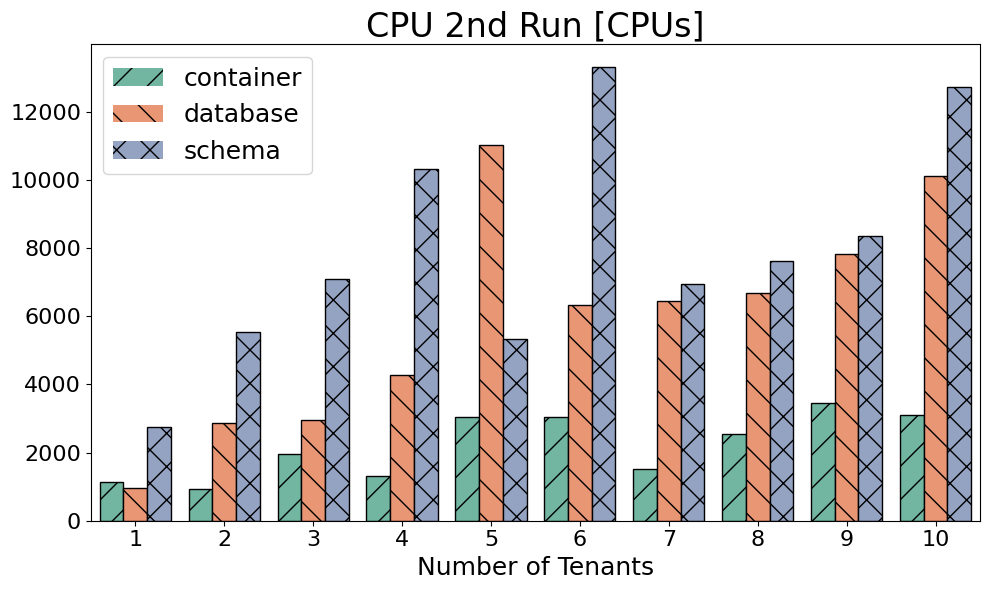

In [43]:
plot_bars(df_performance_second, y='CPU Utilization Time [s]', title='CPU 2nd Run [CPUs]', estimator='max')

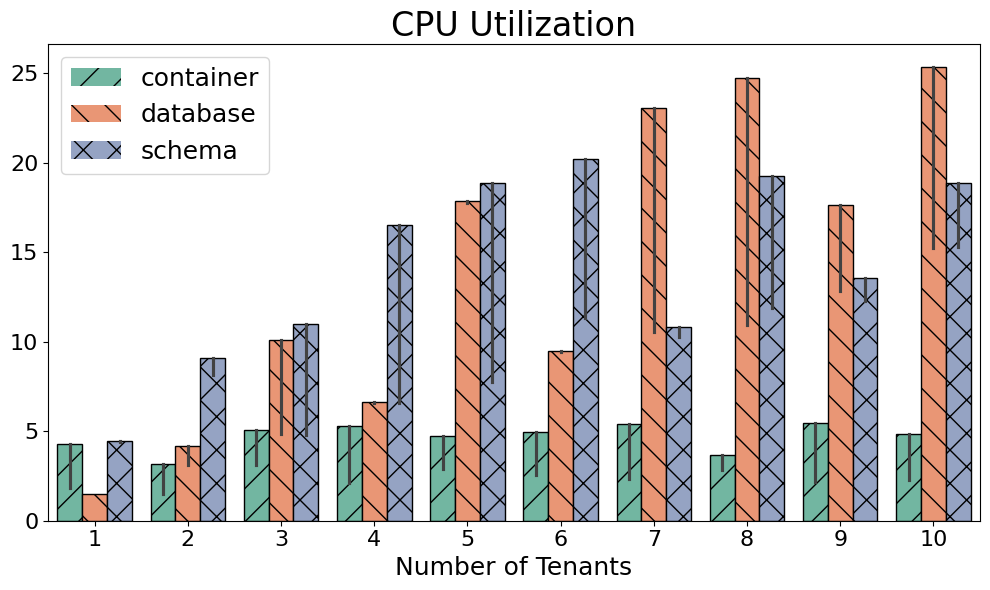

In [44]:
plot_bars(df_performance, y='CPU Utilization', title='CPU Utilization', estimator='max')

## Custom Aggregation

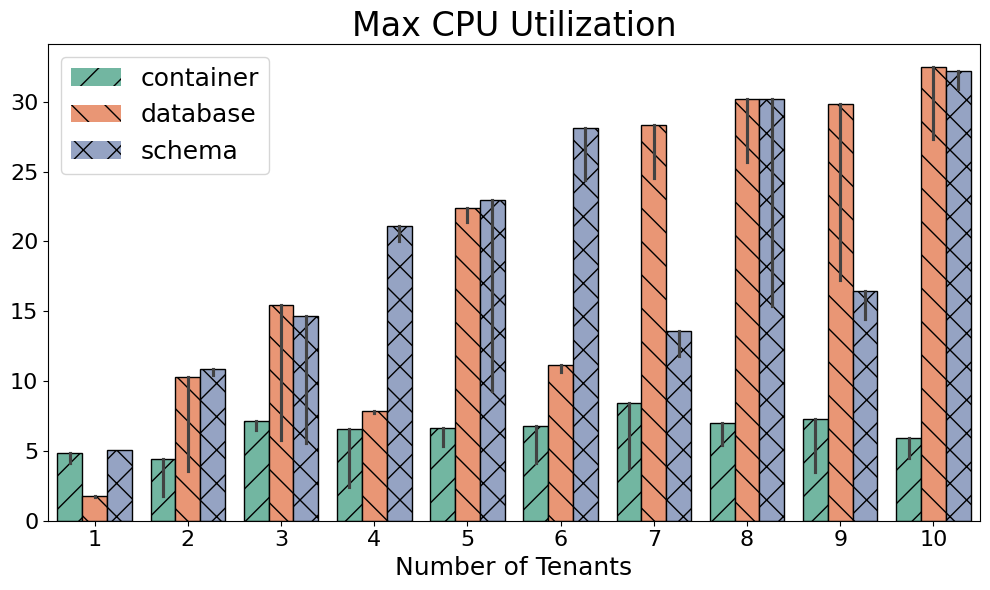

In [45]:
metric = 'total_cpu_util'

df_performance_series = collect.get_monitoring_timeseries_all(metric)

df_agg = (
    df_performance_series.groupby(["client", "type", "num_tenants"])["value"]
      .max()
      .reset_index()
)
plot_bars(df_agg, y='value', title='Max CPU Utilization', estimator='max')
#df_agg

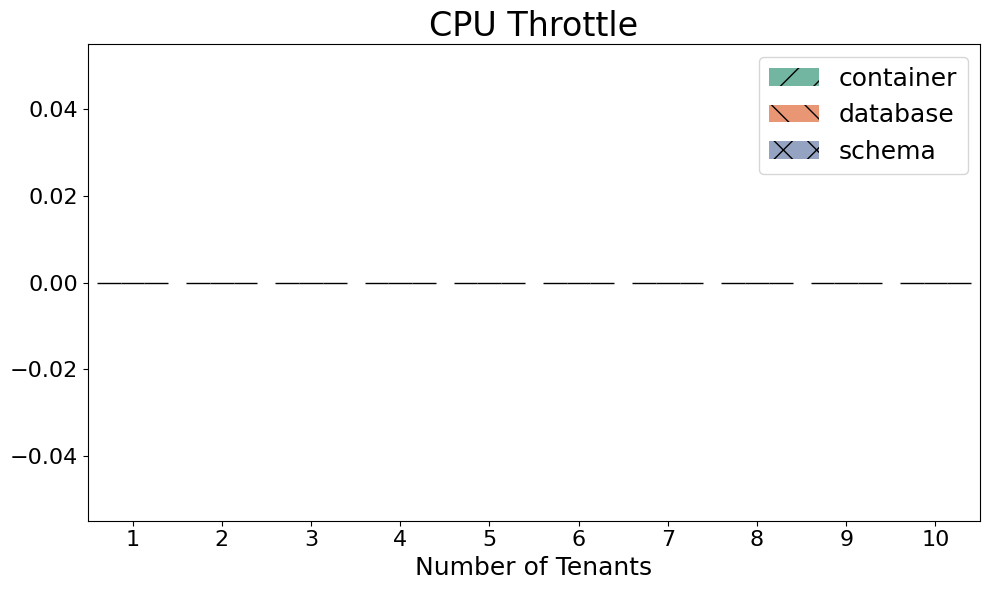

In [46]:
plot_bars(df_performance, y='CPU Throttle', title='CPU Throttle', estimator='max')

## Custom Aggregation and Scale

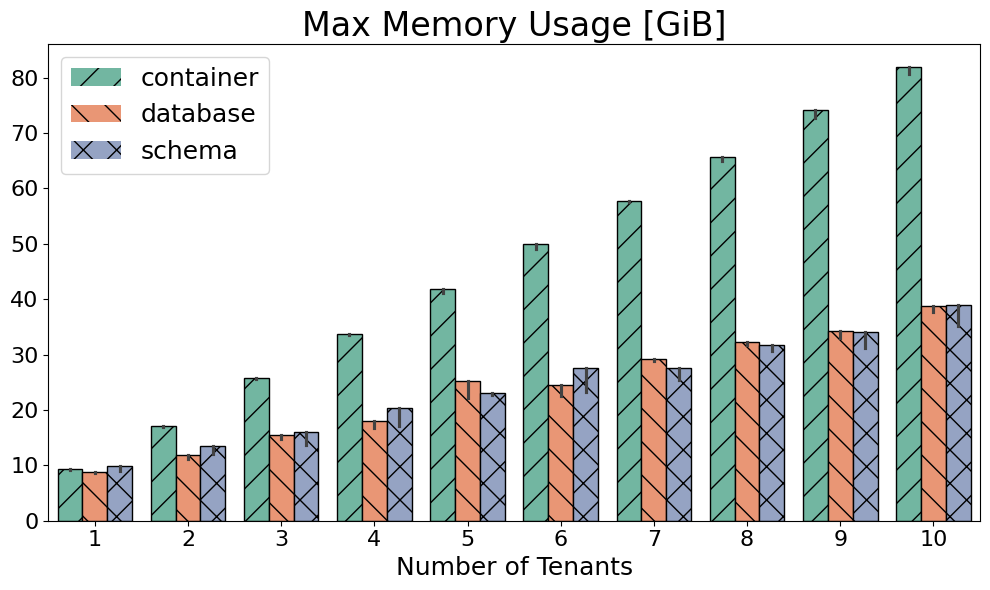

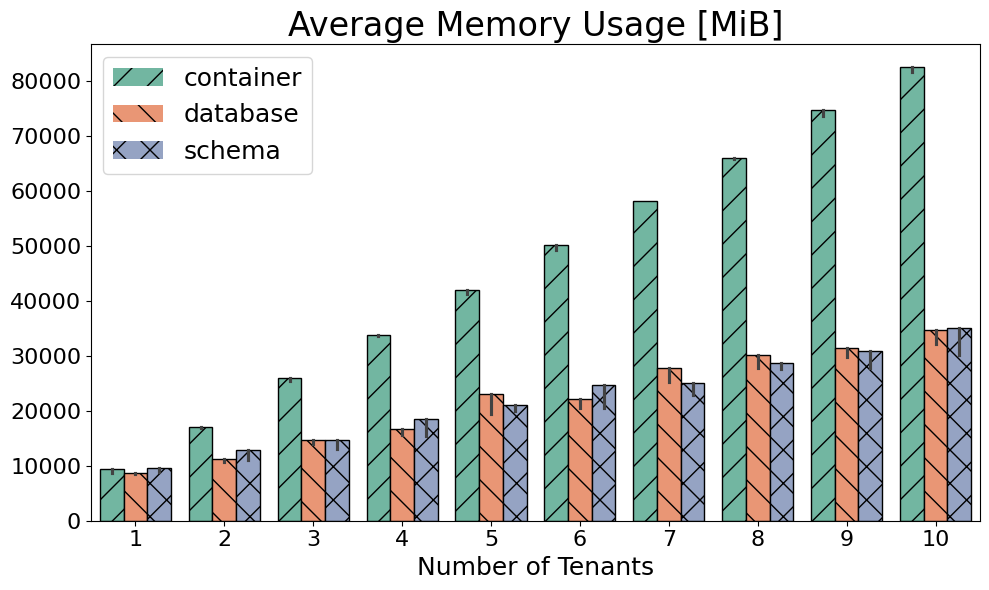

In [47]:
metric = 'total_cpu_memory'

df_performance_series = collect.get_monitoring_timeseries_all(metric)

df_agg = (
    df_performance_series.groupby(["client", "type", "num_tenants"])["value"]
      .max()
      .reset_index()
)
df_agg['value'] = df_agg['value'] / 1024.
plot_bars(df_agg, y='value', title='Max Memory Usage [GiB]', estimator='max')

plot_bars(df_performance, y='Memory Usage [MiB]', title='Average Memory Usage [MiB]', estimator='max')

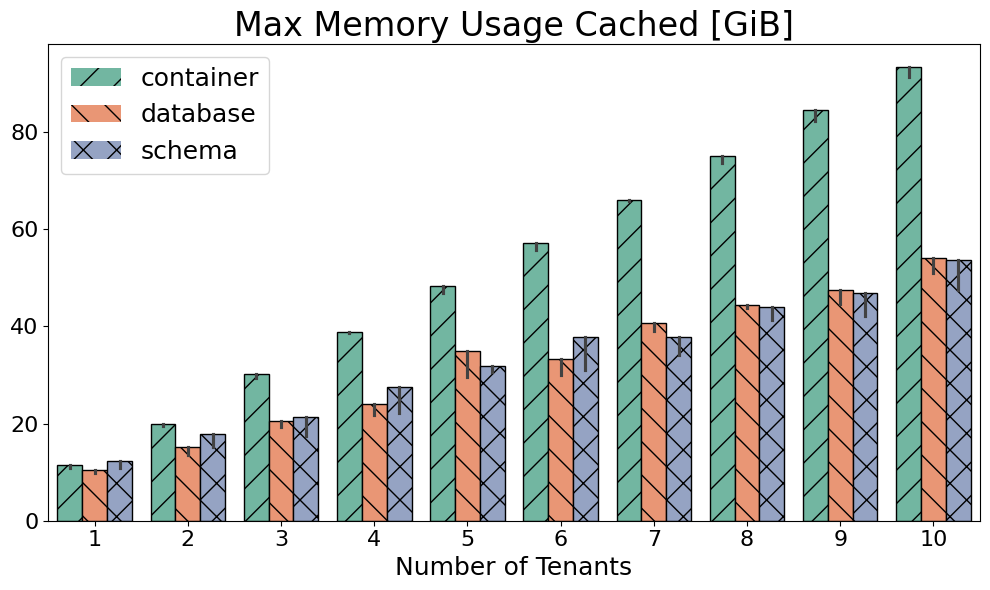

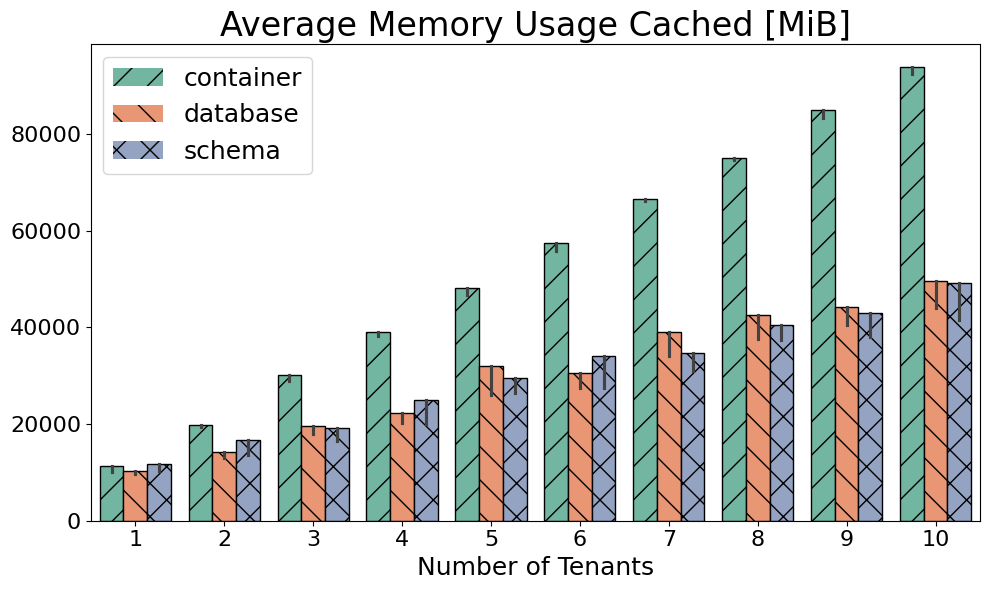

In [48]:
metric = 'total_cpu_memory_cached'

df_performance_series = collect.get_monitoring_timeseries_all(metric)

df_agg = (
    df_performance_series.groupby(["client", "type", "num_tenants"])["value"]
      .max()
      .reset_index()
)
df_agg['value'] = df_agg['value'] / 1024.
plot_bars(df_agg, y='value', title='Max Memory Usage Cached [GiB]', estimator='max')

plot_bars(df_performance, y='Memory Usage Cached [MiB]', title='Average Memory Usage Cached [MiB]', estimator='max')

# Hardware Monitoring for Loading Phase

In [49]:
#df_performance = collect.get_monitoring_all("loading")

#df_performance_first = df_performance[df_performance['client']=='1']
#df_performance_second = df_performance[df_performance['client']=='2']

#df_performance

In [50]:
#plot_bars(df_performance, y='CPU Utilization Time [s]', title='CPU [CPUs]', estimator='max')

In [51]:
#plot_bars(df_performance, y='Memory Usage [MiB]', title='Memory Usage [MiB]', estimator='max')

In [52]:
#plot_bars(df_performance, y='Memory Usage Cached [MiB]', title='Memory Usage Cached [MiB]', estimator='max')

# Efficiency

In [53]:
client = '1'

df_performance_monitoring = collect.get_monitoring_all(type="stream")
df_performance_monitoring = df_performance_monitoring[df_performance_monitoring['client'] == client]
df_performance = collect.get_performance_all()
df_performance = df_performance[df_performance['client'] == client]
merged_df = pd.merge(df_performance, df_performance_monitoring, on=['type', 'num_tenants', 'code', 'client'], how='inner')
#merged_df['I_Lat'] = 1./merged_df['E_Lat']
merged_df['E_Tpx'] = merged_df['Goodput (requests/second)'] / merged_df['CPU Utilization Time [s]'] * 600.
merged_df['E_Lat'] = 1./np.sqrt(merged_df['Latency Distribution.Average Latency (microseconds)']*merged_df['CPU Utilization Time [s]']/1E6)
merged_df['E_RAM'] = (merged_df['Goodput (requests/second)']) / merged_df['Memory Usage [MiB]']
merged_df

,client,Goodput (requests/second),num_errors,Latency Distribution.Average Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),type,num_tenants,code,Memory Usage [MiB],Memory Usage Cached [MiB],...,Longest Idle-in-Transaction (Aborted),Dead tuples per vacuum operation [tuples/vacuum],Number of WAL Segments,Total WAL Size [GiB],WAL Segments Growth Rate [segments/s],WAL Growth Rate [MiB/s],Average WAL Segment Size [MiB],E_Tpx,E_Lat,E_RAM
0,1,1242.921531,4,7.979100e+04,493516,container,1,1758279829,8748.56,10169.12,...,0.0,inf,121.49,1.90,0.09,1.38,16.0,264.762156,0.066704,0.142072
1,1,433.713305,0,2.290860e+05,1403192,database,1,1758277451,8457.75,9672.74,...,0.0,inf,104.00,1.62,0.01,0.19,16.0,267.947552,0.067042,0.051280
2,1,1256.169869,6,7.893300e+04,479796,schema,1,1758275241,8788.90,10214.40,...,0.0,inf,122.12,1.91,0.09,1.40,16.0,272.591519,0.067690,0.142927
3,1,781.544938,3,2.540850e+05,1868995,container,2,1758287255,16880.04,19299.69,...,0.0,inf,208.00,3.24,0.00,0.00,32.0,238.628746,0.044753,0.046300
4,1,798.786610,4,2.488605e+05,1549428,database,2,1758284694,10683.17,13070.50,...,0.0,inf,207.00,3.23,0.01,0.09,16.0,243.043452,0.045141,0.074771
5,1,2008.796519,4,9.861600e+04,737190,schema,2,1758282052,11021.86,13640.47,...,0.0,inf,222.34,3.47,0.05,0.85,16.0,220.546520,0.043076,0.182256
6,1,1283.186571,6,2.322003e+05,1595027,container,3,1758296938,25316.04,28896.65,...,0.0,inf,312.00,4.86,0.00,0.00,48.0,237.105365,0.036418,0.050687
7,1,2305.006522,12,1.288990e+05,1123023,database,3,1758294782,13985.52,17976.74,...,0.0,inf,321.15,5.02,0.09,1.50,16.0,222.918093,0.035362,0.164814
8,1,1154.903273,7,2.580673e+05,1648161,schema,3,1758292405,13053.10,16583.00,...,0.0,inf,310.00,4.84,0.02,0.33,16.0,236.136297,0.036338,0.088477
9,1,1191.239934,2,3.331838e+05,2335635,container,4,1758304941,33602.17,38305.03,...,0.0,inf,416.00,6.48,0.00,0.00,64.0,220.814669,0.030451,0.035451


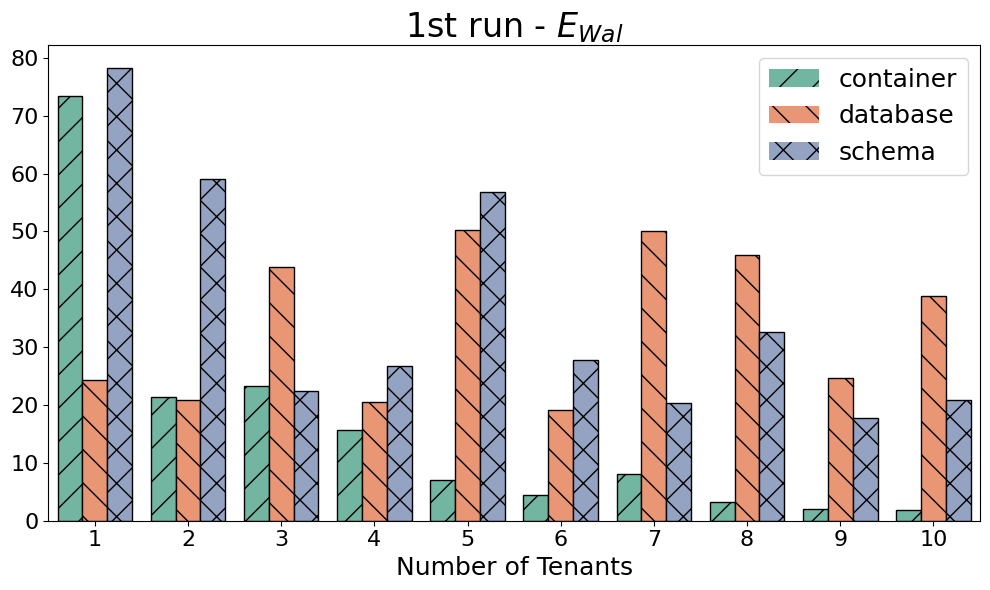

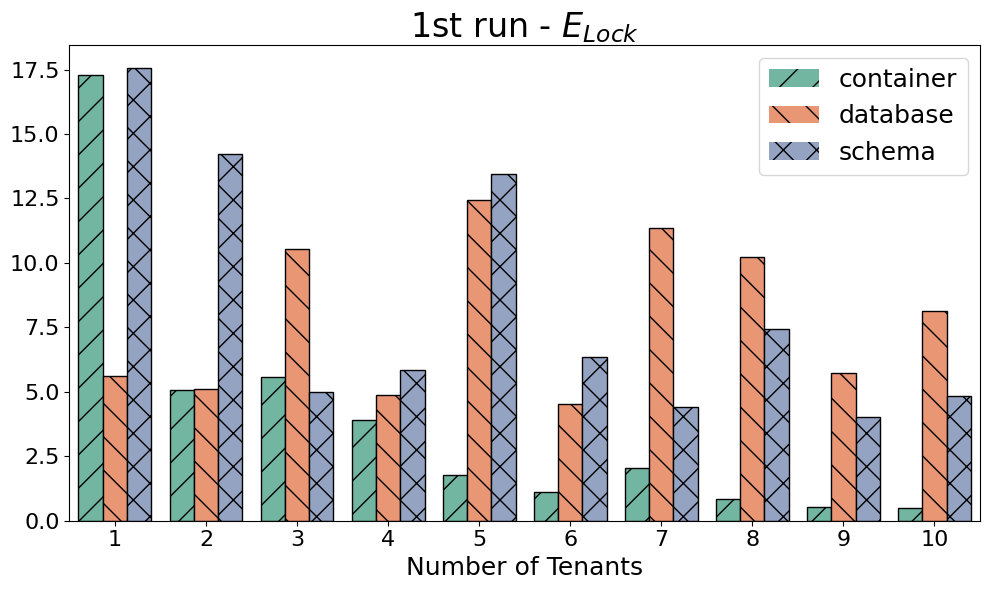

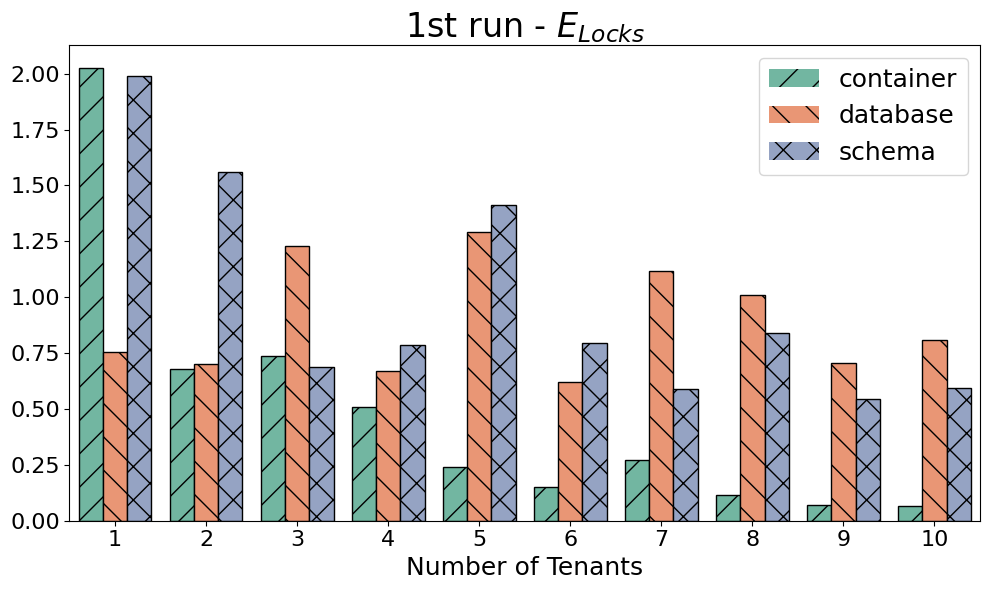

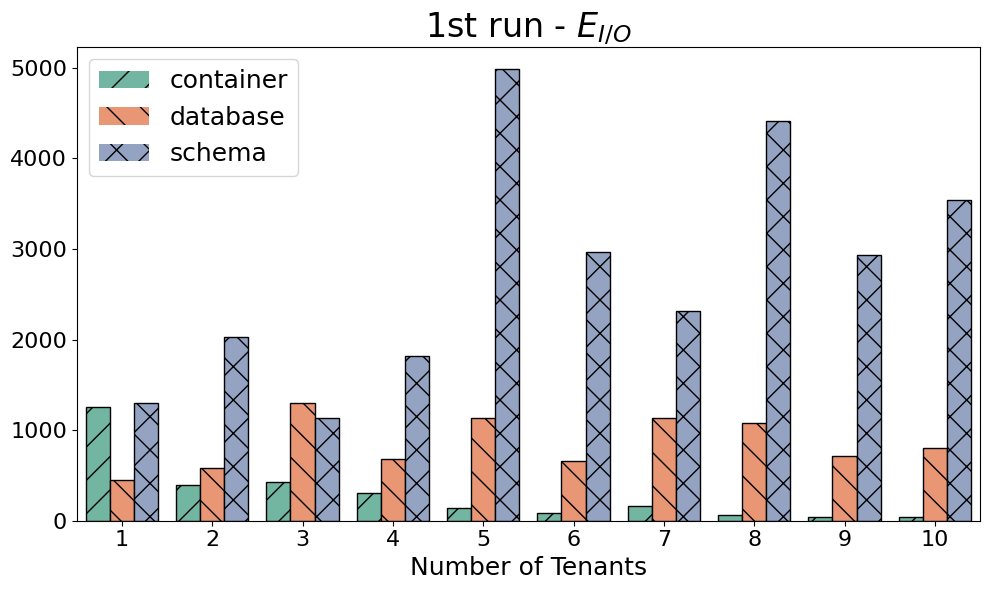

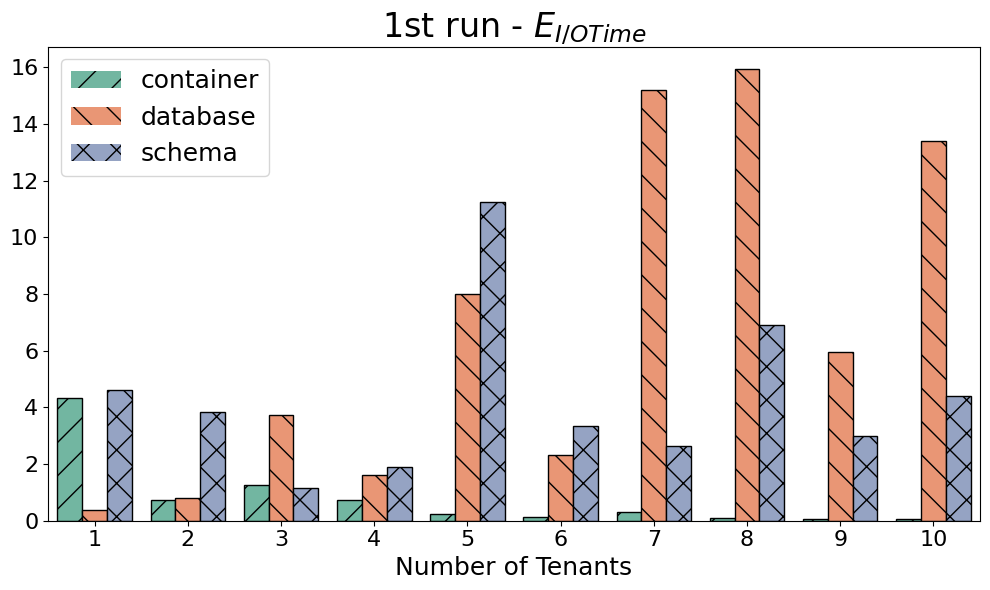

In [54]:
merged_df['E_Wal'] = (merged_df['Goodput (requests/second)']) / merged_df['Active Backends Waiting on WAL']
merged_df['E_Lock'] = (merged_df['Goodput (requests/second)']) / merged_df['Active Backends Waiting on Locks']
merged_df['E_IO'] = (merged_df['Goodput (requests/second)']) / merged_df['Active Backends Waiting on I/O']
merged_df['E_IOTime'] = (merged_df['Goodput (requests/second)']) / merged_df['Total I/O Wait Time [s]']
merged_df['E_Locks'] = (merged_df['Goodput (requests/second)']) / merged_df['Total Locks Current']


plot_bars(merged_df, y='E_Wal', title='1st run - $E_{Wal}$', estimator='max')
plot_bars(merged_df, y='E_Lock', title='1st run - $E_{Lock}$', estimator='max')
plot_bars(merged_df, y='E_Locks', title='1st run - $E_{Locks}$', estimator='max')
plot_bars(merged_df, y='E_IO', title='1st run - $E_{I/O}$', estimator='max')
plot_bars(merged_df, y='E_IOTime', title='1st run - $E_{I/O Time}$', estimator='max')


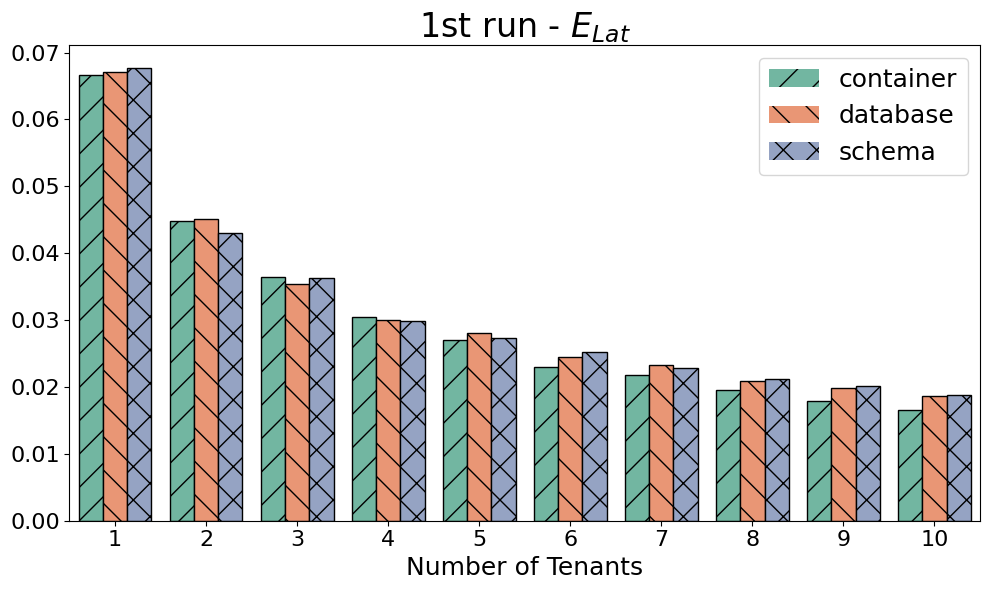

In [55]:
plot_bars(merged_df, y='E_Lat', title='1st run - $E_{Lat}$', estimator='max')

In [56]:
#plot_bars(merged_df, y='I_Lat', title='1st run - $I_{Lat}$', estimator='max')

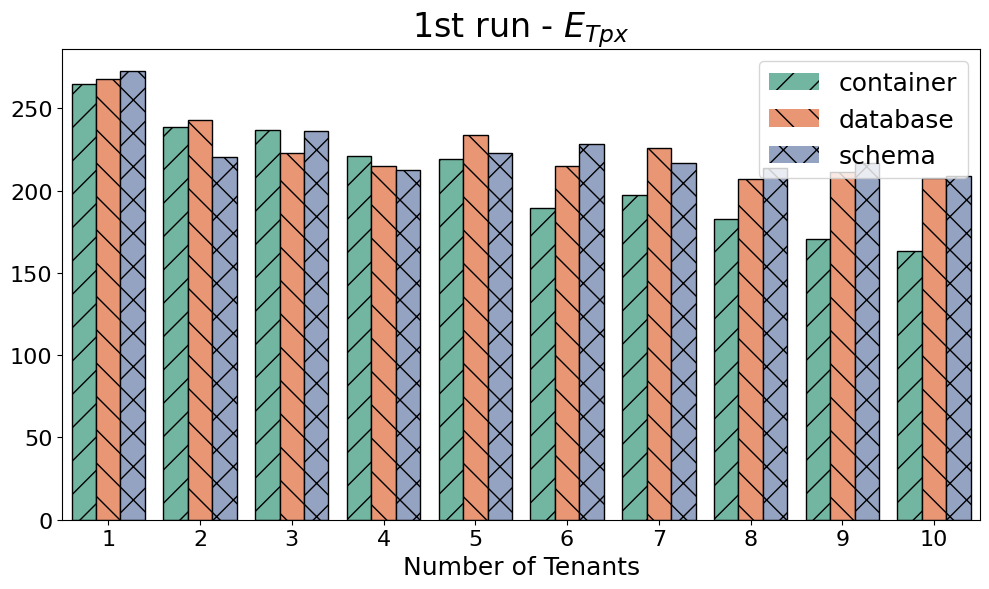

In [57]:
plot_bars(merged_df, y='E_Tpx', title='1st run - $E_{Tpx}$', estimator='max')

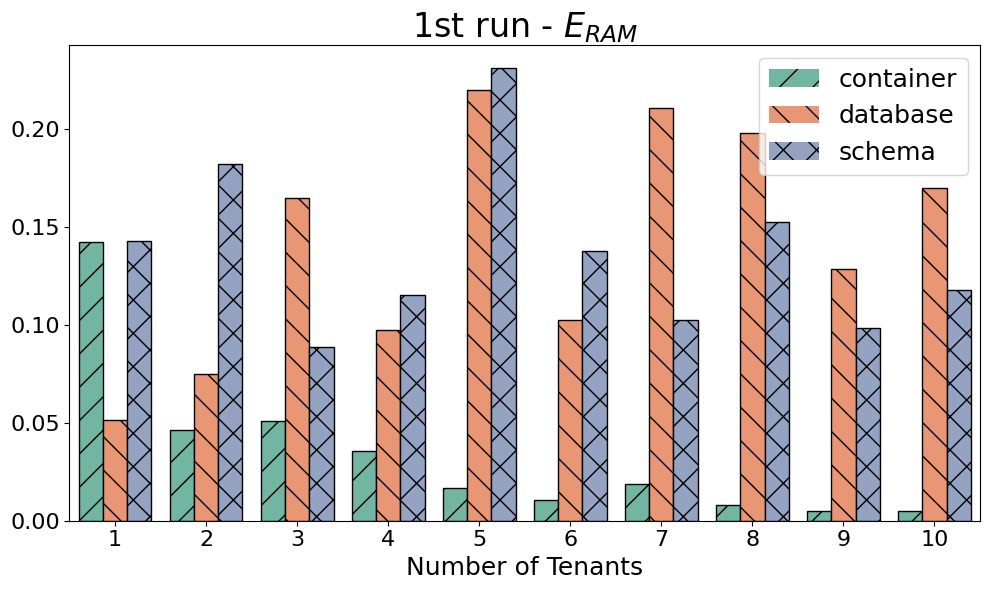

In [58]:
plot_bars(merged_df, y='E_RAM', title='1st run - $E_{RAM}$', estimator='min')

In [59]:
client = '2'

df_performance_monitoring = collect.get_monitoring_all(type="stream")
df_performance_monitoring = df_performance_monitoring[df_performance_monitoring['client'] == client]
df_performance = collect.get_performance_all()
df_performance = df_performance[df_performance['client'] == client]
merged_df = pd.merge(df_performance, df_performance_monitoring, on=['type', 'num_tenants', 'code', 'client'], how='inner')
#merged_df['CPUs/Request'] = merged_df['CPU [CPUs]'] / merged_df['Goodput (requests/second)'] / 600.
merged_df['E_Tpx'] = merged_df['Goodput (requests/second)'] / merged_df['CPU Utilization Time [s]'] * 600.
merged_df['E_Lat'] = 1./np.sqrt(merged_df['Latency Distribution.Average Latency (microseconds)']*merged_df['CPU Utilization Time [s]']/1E6)
merged_df['E_RAM'] = (merged_df['Goodput (requests/second)']) / merged_df['Memory Usage [MiB]']

merged_df

,client,Goodput (requests/second),num_errors,Latency Distribution.Average Latency (microseconds),Latency Distribution.99th Percentile Latency (microseconds),type,num_tenants,code,Memory Usage [MiB],Memory Usage Cached [MiB],...,Longest Idle-in-Transaction (Aborted),Dead tuples per vacuum operation [tuples/vacuum],Number of WAL Segments,Total WAL Size [GiB],WAL Segments Growth Rate [segments/s],WAL Growth Rate [MiB/s],Average WAL Segment Size [MiB],E_Tpx,E_Lat,E_RAM
0,2,527.096650,0,1.883980e+05,1327940,container,1,1758279829,9353.81,11328.60,...,0.0,inf,205.70,3.21,0.08,1.31,16.0,278.016782,0.068309,0.056351
1,2,476.788322,3,2.083970e+05,1312967,database,1,1758277451,8740.95,10225.59,...,0.0,inf,113.76,1.78,0.03,0.50,16.0,300.452657,0.070991,0.054547
2,2,1248.336615,1,7.942300e+04,494814,schema,1,1758275241,9615.85,11751.46,...,0.0,inf,239.65,3.74,0.17,2.76,16.0,273.751026,0.067836,0.129821
3,2,416.553295,4,4.772875e+05,2903080,container,2,1758287255,17122.38,19892.00,...,0.0,inf,208.00,3.24,0.00,0.00,32.0,264.904372,0.047124,0.024328
4,2,1202.031538,5,1.650745e+05,1281844,database,2,1758284694,11299.59,14206.79,...,0.0,inf,224.30,3.50,0.06,0.93,16.0,251.084076,0.045924,0.106378
5,2,2217.188212,5,8.929100e+04,560801,schema,2,1758282052,12796.00,16677.20,...,0.0,inf,408.55,6.38,0.30,4.74,16.0,239.779838,0.044929,0.173272
6,2,757.338257,7,3.931633e+05,3232758,container,3,1758296938,25934.76,30252.44,...,0.0,inf,319.08,4.98,0.03,0.39,48.0,232.672777,0.036088,0.029202
7,2,1176.309935,5,2.532357e+05,1641672,database,3,1758294782,14709.78,19608.93,...,0.0,inf,425.36,6.65,0.17,2.74,16.0,238.537101,0.036532,0.079968
8,2,2698.851557,6,1.100527e+05,816362,schema,3,1758292405,14597.24,19166.63,...,0.0,inf,383.51,5.99,0.23,3.72,16.0,228.643571,0.035819,0.184888
9,2,524.113300,1,7.583560e+05,4659385,container,4,1758304941,33816.39,39061.36,...,0.0,inf,416.00,6.48,0.00,0.00,64.0,238.515200,0.031625,0.015499


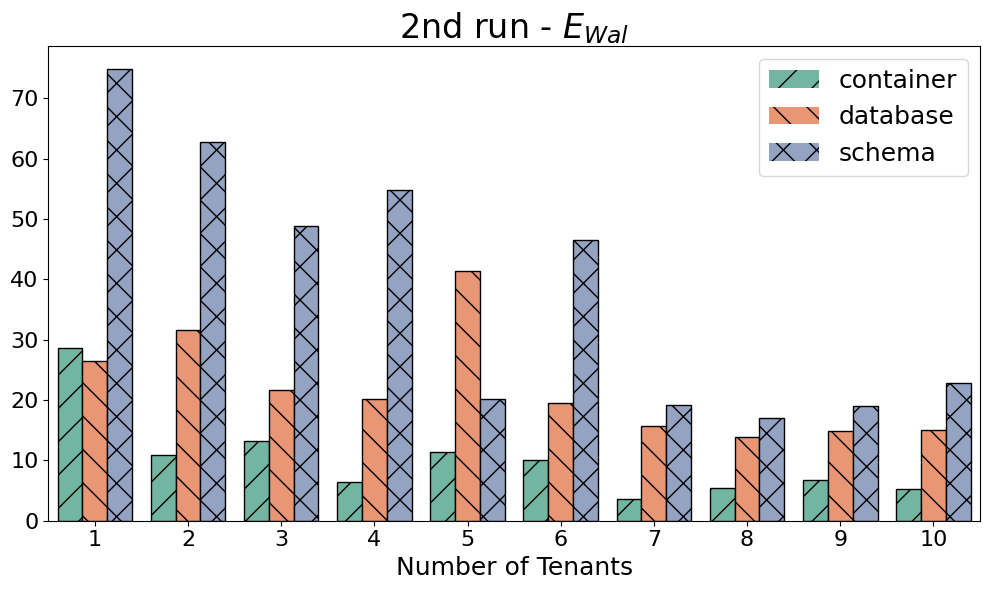

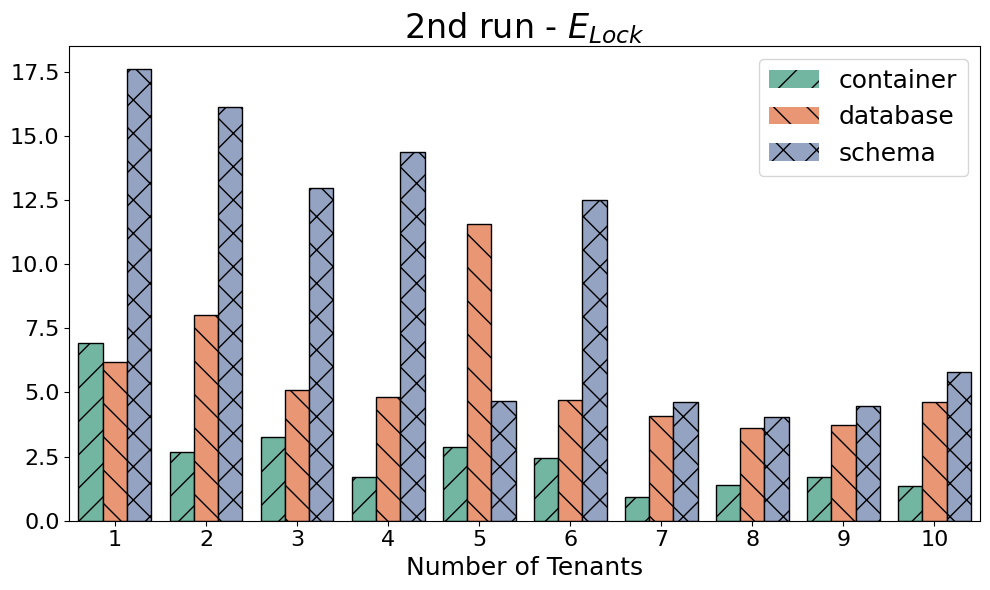

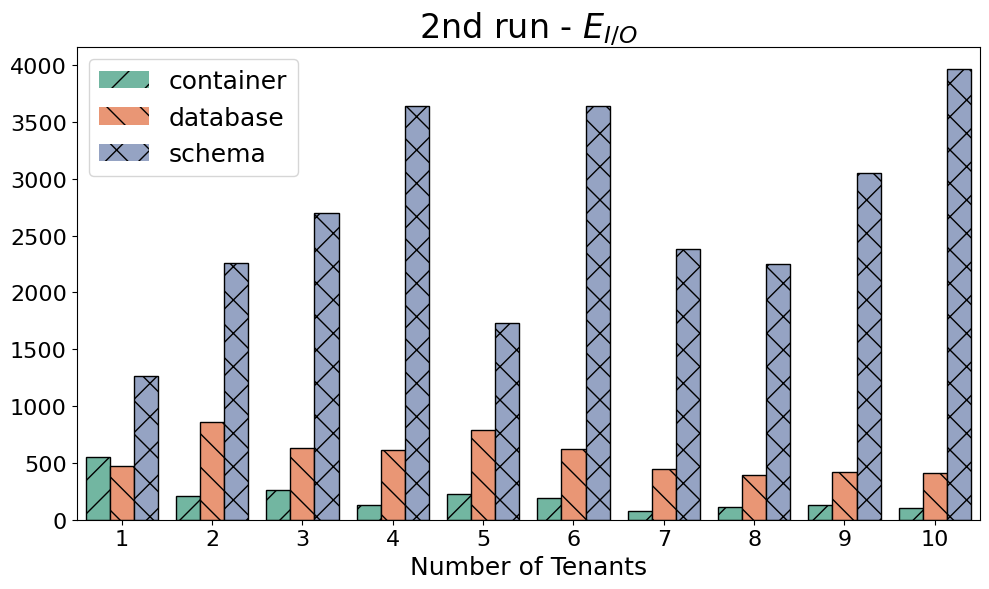

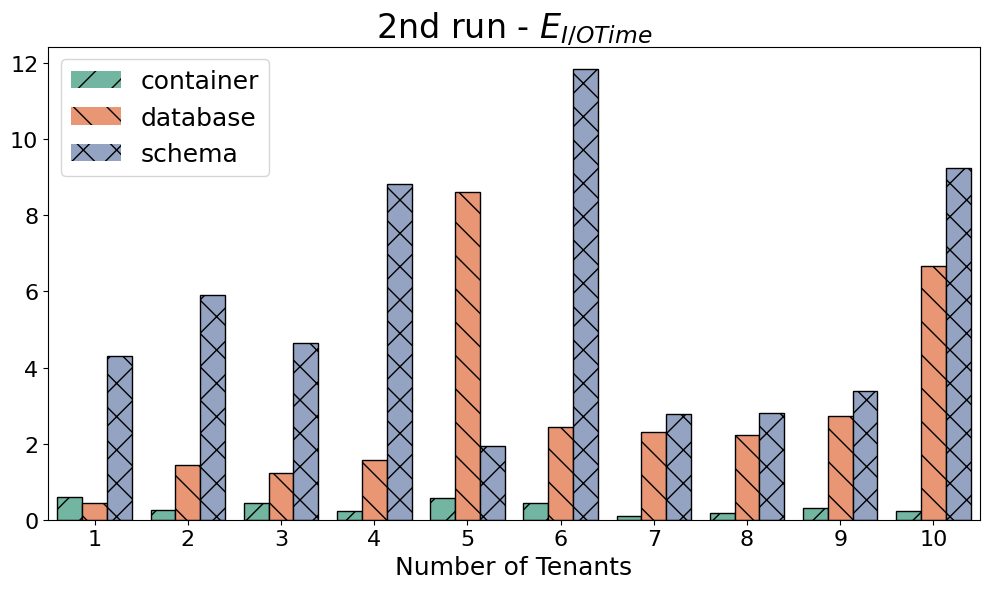

In [60]:
merged_df['E_Wal'] = (merged_df['Goodput (requests/second)']) / merged_df['Active Backends Waiting on WAL']
merged_df['E_Lock'] = (merged_df['Goodput (requests/second)']) / merged_df['Active Backends Waiting on Locks']
merged_df['E_IO'] = (merged_df['Goodput (requests/second)']) / merged_df['Active Backends Waiting on I/O']
merged_df['E_IOTime'] = (merged_df['Goodput (requests/second)']) / merged_df['Total I/O Wait Time [s]']

plot_bars(merged_df, y='E_Wal', title='2nd run - $E_{Wal}$', estimator='max')
plot_bars(merged_df, y='E_Lock', title='2nd run - $E_{Lock}$', estimator='max')
plot_bars(merged_df, y='E_IO', title='2nd run - $E_{I/O}$', estimator='max')
plot_bars(merged_df, y='E_IOTime', title='2nd run - $E_{I/O Time}$', estimator='max')


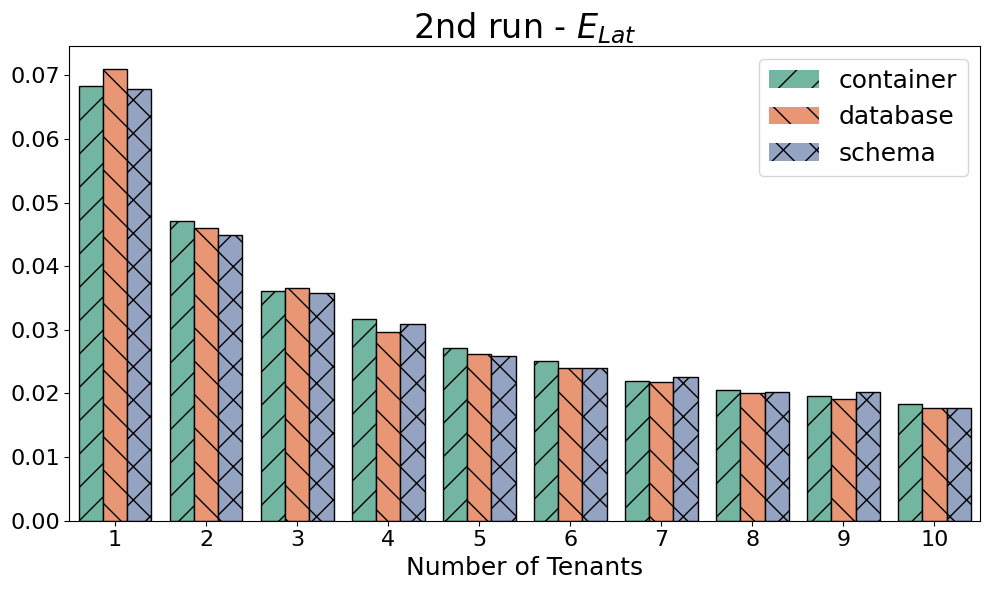

In [61]:
plot_bars(merged_df, y='E_Lat', title='2nd run - $E_{Lat}$', estimator='max')

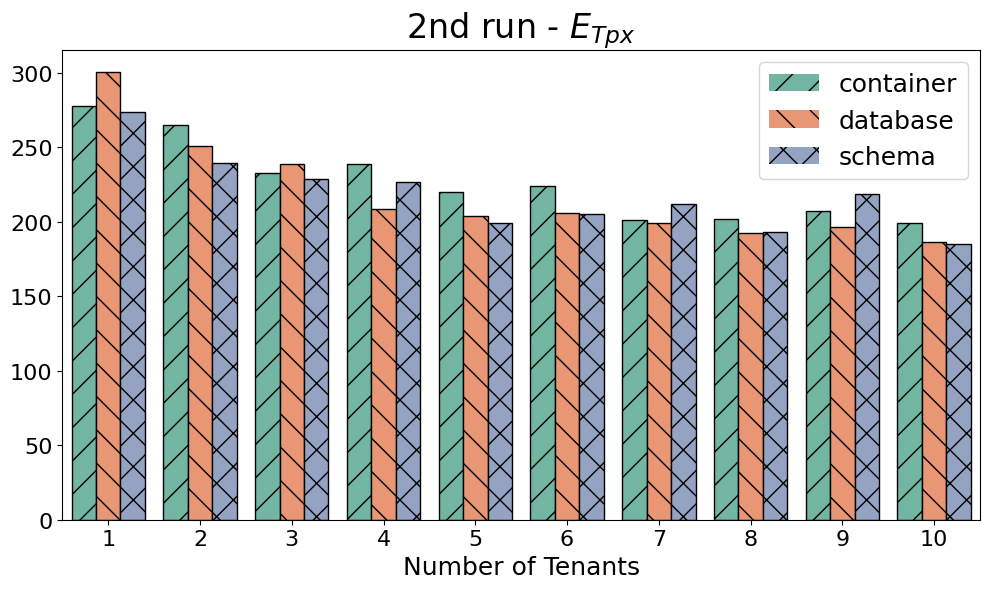

In [62]:
plot_bars(merged_df, y='E_Tpx', title='2nd run - $E_{Tpx}$', estimator='max')

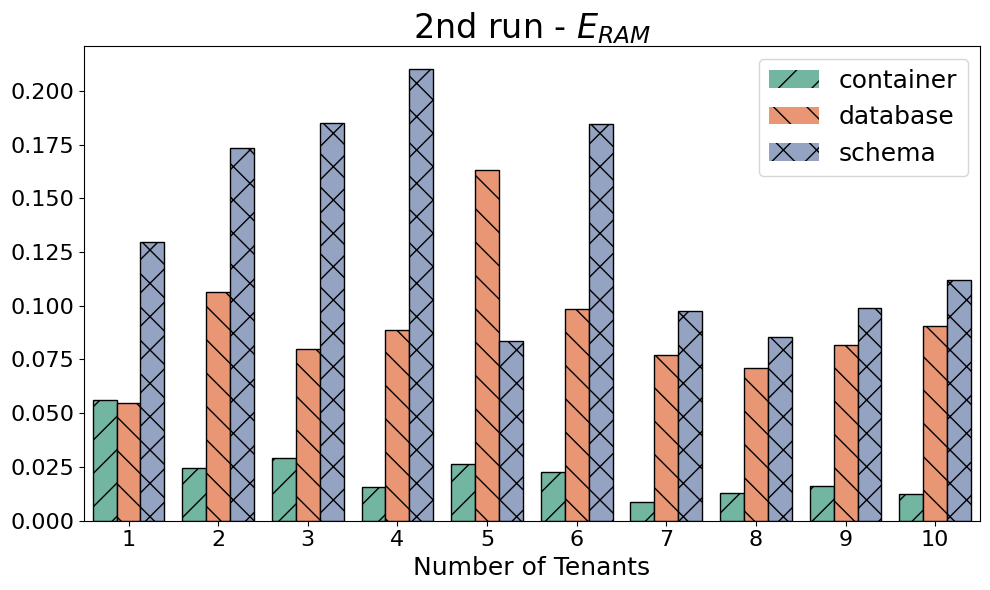

In [63]:
plot_bars(merged_df, y='E_RAM', title='2nd run - $E_{RAM}$', estimator='max')

In [64]:
import os
import zipfile

def zip_all_results():
    # Set the base directory containing the folders
    base_dir = path # "/path/to/your/folders"  # CHANGE THIS to your actual directory
    # List all folder names in the directory
    folder_names = codes
    # Create a zip for each folder
    for folder in folder_names:
        folder_path = os.path.join(base_dir, folder)
        zip_path = os.path.join(base_dir, f"{folder}.zip")
        print(f"Zipping {folder_path} to {zip_path}...")
        with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
            for root, _, files in os.walk(folder_path):
                for file in files:
                    abs_path = os.path.join(root, file)
                    rel_path = os.path.relpath(abs_path, folder_path)
                    zipf.write(abs_path, arcname=os.path.join(folder, rel_path))
    print("✅ Done zipping all folders.")


In [65]:
zip_all_results()

Zipping /home/perdelt/benchmarks/1758279829 to /home/perdelt/benchmarks/1758279829.zip...
Zipping /home/perdelt/benchmarks/1758277451 to /home/perdelt/benchmarks/1758277451.zip...
Zipping /home/perdelt/benchmarks/1758275241 to /home/perdelt/benchmarks/1758275241.zip...
Zipping /home/perdelt/benchmarks/1758287255 to /home/perdelt/benchmarks/1758287255.zip...
Zipping /home/perdelt/benchmarks/1758284694 to /home/perdelt/benchmarks/1758284694.zip...
Zipping /home/perdelt/benchmarks/1758282052 to /home/perdelt/benchmarks/1758282052.zip...
Zipping /home/perdelt/benchmarks/1758296938 to /home/perdelt/benchmarks/1758296938.zip...
Zipping /home/perdelt/benchmarks/1758294782 to /home/perdelt/benchmarks/1758294782.zip...
Zipping /home/perdelt/benchmarks/1758292405 to /home/perdelt/benchmarks/1758292405.zip...
Zipping /home/perdelt/benchmarks/1758304941 to /home/perdelt/benchmarks/1758304941.zip...
Zipping /home/perdelt/benchmarks/1758302525 to /home/perdelt/benchmarks/1758302525.zip...
Zipping /h